In [2]:
!pip install interpret
!pip install catboost

In [45]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import geopandas as gpd
import folium
import matplotlib
from scipy import stats
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder
from sklearn.ensemble import RandomForestClassifier
from sklearn.decomposition import IncrementalPCA
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import PolynomialFeatures
import statsmodels.api as sm
from statsmodels.formula.api import ols
from statsmodels.stats.multicomp import pairwise_tukeyhsd
import matplotlib.colors as mcolors
import math
import gc
from catboost import CatBoostRegressor, CatBoostClassifier
from interpret.glassbox import ExplainableBoostingRegressor, ExplainableBoostingClassifier
from interpret import show
from sklearn.preprocessing import StandardScaler
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from sklearn.metrics import log_loss
from sklearn.metrics import brier_score_loss
from sklearn.calibration import calibration_curve
import matplotlib.pyplot as plt
from sklearn.metrics import r2_score
from sklearn.model_selection import RandomizedSearchCV
from sklearn.neural_network import MLPRegressor
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.inspection import permutation_importance
import joblib
import os
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import MinMaxScaler

# **Mount Drive**

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# **Read in CSV**

In [46]:
# Specify the file path in Google Drive
input_path = '/content/drive/MyDrive/Capstone/Data/san_diego_incidents_with_weather.csv'

# Read the CSV file into a DataFrame
final_df = pd.read_csv(input_path)

# Display the first few rows to confirm the data has been loaded
final_df.head()

,ID,Source,Severity,Start_Time,End_Time,Start_Lat,Start_Lng,End_Lat,End_Lng,Distance(mi),...,wind_gust,rain_1h,rain_3h,snow_1h,snow_3h,clouds_all,weather_id,weather_main,weather_description,weather_icon
0,A-42969,Source2,3,2016-06-21 14:08:48-07:00,2016-06-21 14:53:48,33.084377,-117.298370,NaN,NaN,0.0,...,NaN,NaN,NaN,NaN,NaN,75,701,Mist,mist,50d
1,A-42976,Source2,3,2016-06-21 14:21:03-07:00,2016-06-21 15:06:03,33.152199,-117.336304,NaN,NaN,0.0,...,NaN,NaN,NaN,NaN,NaN,75,701,Mist,mist,50d
2,A-42979,Source2,3,2016-06-21 14:35:48-07:00,2016-06-21 15:20:48,33.069042,-117.293587,NaN,NaN,0.0,...,NaN,NaN,NaN,NaN,NaN,75,701,Mist,mist,50d
3,A-43138,Source2,2,2016-06-21 20:38:49-07:00,2016-06-21 21:23:49,33.152874,-117.295479,NaN,NaN,0.0,...,NaN,NaN,NaN,NaN,NaN,75,803,Clouds,broken clouds,04n
4,A-43218,Source2,3,2016-06-22 09:37:34-07:00,2016-06-22 10:18:00,33.065647,-117.292549,NaN,NaN,0.0,...,NaN,NaN,NaN,NaN,NaN,75,803,Clouds,broken clouds,04d


In [6]:
final_df.shape

(96078, 91)

# **Univariate Non-Graphical Analysis**

In [47]:
# Create a copy of final_df
final_df_copy = final_df.copy()

# Converting Start_Time, End_Time and Weather_Timestamp to datetime format

In [48]:
final_df_copy['Start_Time'] = pd.to_datetime(final_df_copy['Start_Time'],  errors='coerce', utc=True)
final_df_copy['End_Time'] = pd.to_datetime(final_df_copy['End_Time'], errors='coerce', utc=True)
final_df_copy['Weather_Timestamp'] = pd.to_datetime(final_df_copy['Weather_Timestamp'], errors='coerce', utc=True)

# Sorting Timestamps in ascending order

In [49]:
# Check if the timestamp column is sorted in ascending order
is_sorted = final_df_copy['Start_Time'].is_monotonic_increasing
print(f"Data is sorted in ascending order: {is_sorted}")

Data is sorted in ascending order: False


In [10]:
# Sort the data by 'Weather_Timestamp' in ascending order
final_df_copy = final_df_copy.sort_values(by='Start_Time')

# Verify the data is now sorted
is_sorted = final_df_copy['Start_Time'].is_monotonic_increasing
print(f"Data is now sorted in ascending order: {is_sorted}")

Data is now sorted in ascending order: True


# Print data types for each column

In [11]:
# Convert dtypes to a DataFrame
dtypes_df = final_df_copy.dtypes.reset_index()
dtypes_df.columns = ['Column', 'DataType']

# Display all rows in the DataFrame
pd.options.display.max_rows = None
print(dtypes_df)

                   Column             DataType
0                      ID               object
1                  Source               object
2                Severity                int64
3              Start_Time  datetime64[ns, UTC]
4                End_Time  datetime64[ns, UTC]
5               Start_Lat              float64
6               Start_Lng              float64
7                 End_Lat              float64
8                 End_Lng              float64
9            Distance(mi)              float64
10            Description               object
11                 Street               object
12                   City               object
13                 County               object
14                  State               object
15                Zipcode               object
16                Country               object
17               Timezone               object
18           Airport_Code               object
19      Weather_Timestamp  datetime64[ns, UTC]
20         Te

# Handling Missing Values

In [12]:
missing_values = final_df_copy.isnull().sum()
print(missing_values)

ID                           0
Source                       0
Severity                     0
Start_Time                   0
End_Time                     0
Start_Lat                    0
Start_Lng                    0
End_Lat                  37757
End_Lng                  37757
Distance(mi)                 0
Description                  0
Street                     245
City                         0
County                       0
State                        0
Zipcode                      0
Country                      0
Timezone                     0
Airport_Code                 0
Weather_Timestamp          450
Temperature(F)            2175
Wind_Chill(F)            34612
Humidity(%)               2458
Pressure(in)               645
Visibility(mi)             872
Wind_Direction            1778
Wind_Speed(mph)           7996
Precipitation(in)        31292
Weather_Condition          916
Amenity                      0
Bump                         0
Crossing                     0
Give_Way

In [13]:
# Show only columns with missing values
missing_values = missing_values[missing_values > 0]
print(missing_values)

End_Lat                  37757
End_Lng                  37757
Street                     245
Weather_Timestamp          450
Temperature(F)            2175
Wind_Chill(F)            34612
Humidity(%)               2458
Pressure(in)               645
Visibility(mi)             872
Wind_Direction            1778
Wind_Speed(mph)           7996
Precipitation(in)        31292
Weather_Condition          916
Sunrise_Sunset             259
Civil_Twilight             259
Nautical_Twilight          259
Astronomical_Twilight      259
Street Name                423
PeakPeriod                4866
Speed 2022 MPH            4866
Speed 2021 MPH           16297
1 year Speed % change    16297
2021 AADT Range          14509
1 year AADT % change     14509
visibility                 184
sea_level                96078
grnd_level               96078
wind_gust                66817
rain_1h                  84099
rain_3h                  94785
snow_1h                  96078
snow_3h                  96078
dtype: i

In [14]:
# Calculate the missing percentage for these columns
missing_percentage = (missing_values / len(final_df_copy)) * 100

# Display the result
print(missing_percentage)

End_Lat                   39.298278
End_Lng                   39.298278
Street                     0.255001
Weather_Timestamp          0.468369
Temperature(F)             2.263786
Wind_Chill(F)             36.024896
Humidity(%)                2.558338
Pressure(in)               0.671330
Visibility(mi)             0.907596
Wind_Direction             1.850580
Wind_Speed(mph)            8.322405
Precipitation(in)         32.569371
Weather_Condition          0.953392
Sunrise_Sunset             0.269573
Civil_Twilight             0.269573
Nautical_Twilight          0.269573
Astronomical_Twilight      0.269573
Street Name                0.440267
PeakPeriod                 5.064635
Speed 2022 MPH             5.064635
Speed 2021 MPH            16.962260
1 year Speed % change     16.962260
2021 AADT Range           15.101272
1 year AADT % change      15.101272
visibility                 0.191511
sea_level                100.000000
grnd_level               100.000000
wind_gust                 69

In [15]:
# List of columns to drop based on percentage missing
columns_to_drop = ['sea_level', 'grnd_level', 'wind_gust', 'rain_1h', 'rain_3h', 'snow_1h', 'snow_3h']

# Drop these columns from the DataFrame
final_df_copy.drop(columns=columns_to_drop, inplace=True)

# Check the remaining columns
print(final_df_copy.columns)

Index(['ID', 'Source', 'Severity', 'Start_Time', 'End_Time', 'Start_Lat',
       'Start_Lng', 'End_Lat', 'End_Lng', 'Distance(mi)', 'Description',
       'Street', 'City', 'County', 'State', 'Zipcode', 'Country', 'Timezone',
       'Airport_Code', 'Weather_Timestamp', 'Temperature(F)', 'Wind_Chill(F)',
       'Humidity(%)', 'Pressure(in)', 'Visibility(mi)', 'Wind_Direction',
       'Wind_Speed(mph)', 'Precipitation(in)', 'Weather_Condition', 'Amenity',
       'Bump', 'Crossing', 'Give_Way', 'Junction', 'No_Exit', 'Railway',
       'Roundabout', 'Station', 'Stop', 'Traffic_Calming', 'Traffic_Signal',
       'Turning_Loop', 'Sunrise_Sunset', 'Civil_Twilight', 'Nautical_Twilight',
       'Astronomical_Twilight', 'osm_id', 'Street Name', 'Highway', 'Lanes',
       'Speed Limit MPH', 'Length', 'Direction', 'PeakPeriod',
       'Speed 2022 MPH', 'Speed 2021 MPH', '1 year Speed % change',
       '2022 AADT Range', '2021 AADT Range', '1 year AADT % change',
       'geometry', 'longitude', 'lat

In [16]:
# Interpolate continuous columns like Temperature, Wind Chill, etc.
continuous_columns = ['Temperature(F)', 'Wind_Chill(F)', 'Humidity(%)', 'Pressure(in)',
                      'Visibility(mi)', 'Wind_Speed(mph)', 'Precipitation(in)',
                      'Speed 2022 MPH', 'Speed 2021 MPH', '1 year Speed % change',
                      '1 year AADT % change', 'visibility']

final_df_copy.loc[:, continuous_columns] = final_df_copy[continuous_columns].interpolate(method='linear')

# Check for missing values after interpolation
final_df_copy[continuous_columns].isnull().sum()

,0
Temperature(F),0
Wind_Chill(F),207
Humidity(%),0
Pressure(in),0
Visibility(mi),0
Wind_Speed(mph),0
Precipitation(in),43
Speed 2022 MPH,0
Speed 2021 MPH,0
1 year Speed % change,0


In [17]:
# Fill remaining missing values using forward fill and backward fill
final_df_copy.loc[:, continuous_columns] = final_df_copy[continuous_columns].fillna(method='ffill').fillna(method='bfill')

# Check for missing values again
final_df_copy[continuous_columns].isnull().sum()

<ipython-input-17-508429f9e2d7>:2: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  final_df_copy.loc[:, continuous_columns] = final_df_copy[continuous_columns].fillna(method='ffill').fillna(method='bfill')


,0
Temperature(F),0
Wind_Chill(F),0
Humidity(%),0
Pressure(in),0
Visibility(mi),0
Wind_Speed(mph),0
Precipitation(in),0
Speed 2022 MPH,0
Speed 2021 MPH,0
1 year Speed % change,0


In [18]:
# Check for missing values in all columns of df_cleaned
remaining_missing_values = final_df_copy.isnull().sum()

# Filter to show columns with missing values
remaining_missing_values = remaining_missing_values[remaining_missing_values > 0]

# Display the columns with missing values
remaining_missing_values

,0
End_Lat,37757
End_Lng,37757
Street,245
Weather_Timestamp,450
Wind_Direction,1778
Weather_Condition,916
Sunrise_Sunset,259
Civil_Twilight,259
Nautical_Twilight,259
Astronomical_Twilight,259


In [19]:
# Fill missing End_Lat and End_Lng with Start_Lat and Start_Lng respectively
final_df_copy['End_Lat'] = final_df_copy['End_Lat'].fillna(final_df_copy['Start_Lat'])
final_df_copy['End_Lng'] = final_df_copy['End_Lng'].fillna(final_df_copy['Start_Lng'])

In [20]:
# Check how many rows were filled
missing_end_lat = final_df_copy['End_Lat'].isna().sum()
missing_end_lng = final_df_copy['End_Lng'].isna().sum()

print(f'Missing End_Lat: {missing_end_lat}')
print(f'Missing End_Lng: {missing_end_lng}')

Missing End_Lat: 0
Missing End_Lng: 0


In [21]:
# Impute missing values in the following columns with 'Unknown'
final_df_copy['Wind_Direction'] = final_df_copy['Wind_Direction'].fillna('Unknown')
final_df_copy['Weather_Condition'] = final_df_copy['Weather_Condition'].fillna('Unknown')
final_df_copy['Sunrise_Sunset'] = final_df_copy['Sunrise_Sunset'].fillna('Unknown')
final_df_copy['Civil_Twilight'] = final_df_copy['Civil_Twilight'].fillna('Unknown')
final_df_copy['Nautical_Twilight'] = final_df_copy['Nautical_Twilight'].fillna('Unknown')
final_df_copy['Astronomical_Twilight'] = final_df_copy['Astronomical_Twilight'].fillna('Unknown')
final_df_copy['2021 AADT Range'] = final_df_copy['2021 AADT Range'].fillna('Not Available')
final_df_copy['Street'] = final_df_copy['Street'].fillna('Unknown')
final_df_copy['PeakPeriod'] = final_df_copy['PeakPeriod'].fillna('Unknown')
final_df_copy['Street Name'] = final_df_copy['Street Name'].fillna('Unknown')

In [22]:
# Fill missing 'Weather_Timestamp' values with 'Start_Time'
final_df_copy['Weather_Timestamp'].fillna(final_df_copy['Start_Time'], inplace=True)

# Verify that the missing values in 'Weather_Timestamp' are filled
final_df_copy['Weather_Timestamp'].isnull().sum()

<ipython-input-22-6aa8037fff7c>:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  final_df_copy['Weather_Timestamp'].fillna(final_df_copy['Start_Time'], inplace=True)


0

In [23]:
missing_values = final_df_copy.isnull().sum()
missing_values

,0
ID,0
Source,0
Severity,0
Start_Time,0
End_Time,0
Start_Lat,0
Start_Lng,0
End_Lat,0
End_Lng,0
Distance(mi),0


# Summary statistics for numeric columns

In [22]:
final_df_copy.describe()

,Severity,Start_Lat,Start_Lng,End_Lat,End_Lng,Distance(mi),Temperature(F),Wind_Chill(F),Humidity(%),Pressure(in),...,dew_point,feels_like,temp_min,temp_max,pressure,humidity,wind_speed,wind_deg,clouds_all,weather_id
count,96078.000000,96078.000000,96078.000000,96078.000000,96078.000000,96078.000000,96078.000000,96078.000000,96078.000000,96078.000000,...,96078.000000,96078.000000,96078.000000,96078.000000,96078.000000,96078.000000,96078.000000,96078.000000,96078.000000,96078.000000
mean,2.240648,32.939967,-117.162681,32.939856,-117.162119,0.428152,64.382264,54.485978,64.755860,29.756051,...,53.359345,63.976952,62.462551,66.827590,1015.196986,69.799309,8.520598,227.889683,51.275953,754.635494
std,0.448765,0.235346,0.110011,0.236582,0.109969,1.179702,10.234887,15.173464,20.949412,0.374462,...,9.445846,8.549068,7.849797,8.687775,3.784383,17.082730,4.484680,99.276398,33.460056,101.363262
min,1.000000,32.542587,-117.595330,32.542032,-117.602452,0.000000,-29.900000,-1.000000,1.000000,28.130000,...,-1.390000,36.010000,35.010000,41.940000,999.000000,4.000000,0.000000,0.000000,0.000000,200.000000
25%,2.000000,32.750347,-117.216344,32.749613,-117.215248,0.000000,57.200000,41.102463,53.000000,29.590000,...,48.400000,57.940000,56.910000,60.670000,1013.000000,63.000000,5.750000,180.000000,20.000000,800.000000
50%,2.000000,32.855900,-117.147670,32.854827,-117.147520,0.010000,64.000000,56.000000,68.000000,29.880000,...,54.480000,63.790000,62.470000,66.250000,1015.000000,73.000000,8.050000,260.000000,40.000000,801.000000
75%,2.000000,33.132477,-117.104846,33.132912,-117.104609,0.391000,71.000000,66.000000,81.000000,29.990000,...,60.300000,70.070000,67.870000,72.910000,1018.000000,82.000000,11.410000,301.000000,75.000000,803.000000
max,4.000000,33.505274,-116.102140,33.543327,-116.096730,22.570000,111.000000,111.000000,100.000000,30.540000,...,74.120000,99.820000,99.910000,105.960000,1032.000000,100.000000,36.910000,360.000000,100.000000,804.000000


In [24]:
# Set pandas options to ensure we display all columns
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)

# Generate summary statistics for the dataframe
summary_stats = final_df_copy.describe()

# Format the summary statistics table as per your requirement
summary_stats_transposed = summary_stats.T  # Transpose to display variables as rows

# Renaming columns for readability (optional)
summary_stats_transposed = summary_stats_transposed.rename(columns={
    'count': 'Count',
    'mean': 'Mean',
    'std': 'Std',
    'min': 'Min',
    '25%': '25%',
    '50%': '50%',
    '75%': '75%',
    'max': 'Max'
})

# Format the output to match your table layout
summary_stats_transposed = summary_stats_transposed.round(2)  # Round values to 2 decimal places

# Print the formatted summary statistics
print("Summary Statistics for Traffic Accident Dataset")
print(summary_stats_transposed.to_string())

Summary Statistics for Traffic Accident Dataset
                         Count          Mean           Std           Min           25%           50%           75%           Max
Severity               96078.0  2.240000e+00  4.500000e-01  1.000000e+00  2.000000e+00  2.000000e+00  2.000000e+00  4.000000e+00
Start_Lat              96078.0  3.294000e+01  2.400000e-01  3.254000e+01  3.275000e+01  3.286000e+01  3.313000e+01  3.351000e+01
Start_Lng              96078.0 -1.171600e+02  1.100000e-01 -1.176000e+02 -1.172200e+02 -1.171500e+02 -1.171000e+02 -1.161000e+02
End_Lat                96078.0  3.294000e+01  2.400000e-01  3.254000e+01  3.275000e+01  3.285000e+01  3.313000e+01  3.354000e+01
End_Lng                96078.0 -1.171600e+02  1.100000e-01 -1.176000e+02 -1.172200e+02 -1.171500e+02 -1.171000e+02 -1.161000e+02
Distance(mi)           96078.0  4.300000e-01  1.180000e+00  0.000000e+00  0.000000e+00  1.000000e-02  3.900000e-01  2.257000e+01
Temperature(F)         96078.0  6.438000e+01  1.0

# Frequency Distribution for Categorical Columns

In [ ]:
# List of categorical columns
categorical_columns = ['City', 'Weather_Condition', 'Street', 'Wind_Direction']

# Frequency distribution for categorical columns
for col in categorical_columns:
    print(f"\nDistribution for {col}:")
    print(final_df_copy[col].value_counts())


Distribution for City:
City
San Diego                           49361
Escondido                            5815
Fallbrook                            4414
Carlsbad                             3361
Vista                                3286
National City                        3270
Oceanside                            3006
San Marcos                           2952
Temecula                             2745
Encinitas                            2196
Chula Vista                          2124
La Jolla                             1381
San Clemente                         1130
Del Mar                              1112
Camp Pendleton                       1022
El Cajon                              927
Cardiff By the Sea                    896
Bonsall                               848
Rancho Santa Fe                       581
La Mesa                               559
Spring Valley                         541
Pala                                  456
Solana Beach                          451
Valle

In [ ]:
# List of categorical columns
categorical_columns = ['Sunrise_Sunset', 'Civil_Twilight', 'Nautical_Twilight',
                       'Street Name', 'Highway', 'Direction', 'PeakPeriod',
                       'weather_main', 'weather_description', 'Bump', 'Crossing',
                       'Give_Way', 'Junction', 'No_Exit', 'Railway', 'Roundabout',
                       'Station', 'Stop', 'Traffic_Calming', 'Traffic_Signal',
                       'Turning_Loop']

# Frequency distribution for categorical columns
for col in categorical_columns:
    print(f"\nDistribution for {col}:")
    print(final_df_copy[col].value_counts())


Distribution for Sunrise_Sunset:
Sunrise_Sunset
Day        65816
Night      30003
Unknown      259
Name: count, dtype: int64

Distribution for Civil_Twilight:
Civil_Twilight
Day        69818
Night      26001
Unknown      259
Name: count, dtype: int64

Distribution for Nautical_Twilight:
Nautical_Twilight
Day        74405
Night      21414
Unknown      259
Name: count, dtype: int64

Distribution for Street Name:
Street Name
Old Highway 395, US 395 HISTORIC                 3788
Camino del Rio North                             2614
Market Street                                    2282
Clairemont Mesa Boulevard                        1836
Home Avenue                                      1804
Kearny Villa Road                                1601
Vista Way                                        1549
West Mission Avenue, S14                         1524
El Camino Real                                   1511
Vandegrift Boulevard                             1497
University Avenue                

# Outlier Detection of Numeric Columns

In [ ]:
# Select only numeric columns (float64 and int64)
numeric_df = final_df_copy.select_dtypes(include=['float64', 'int64'])

# Dictionary to store outliers
outliers = {}

# Loop through each numeric column to detect outliers using the IQR method
for col in numeric_df.columns:
    Q1 = final_df_copy[col].quantile(0.25)
    Q3 = final_df_copy[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers[col] = final_df_copy[(final_df_copy[col] < lower_bound) | (final_df_copy[col] > upper_bound)][col]

# Summary of outliers
for col, outlier_data in outliers.items():
    print(f"Column: {col}, Outliers Count: {len(outlier_data)}")


Column: Severity, Outliers Count: 22840
Column: Start_Lat, Outliers Count: 0
Column: Start_Lng, Outliers Count: 4801
Column: End_Lat, Outliers Count: 0
Column: End_Lng, Outliers Count: 4787
Column: Distance(mi), Outliers Count: 10469
Column: Temperature(F), Outliers Count: 1061
Column: Wind_Chill(F), Outliers Count: 11
Column: Humidity(%), Outliers Count: 774
Column: Pressure(in), Outliers Count: 5581
Column: Visibility(mi), Outliers Count: 23255
Column: Wind_Speed(mph), Outliers Count: 895
Column: Precipitation(in), Outliers Count: 17101
Column: osm_id, Outliers Count: 9319
Column: Lanes, Outliers Count: 0
Column: Speed Limit MPH, Outliers Count: 16554
Column: Length, Outliers Count: 9317
Column: Speed 2022 MPH, Outliers Count: 1891
Column: Speed 2021 MPH, Outliers Count: 1283
Column: 1 year Speed % change, Outliers Count: 6815
Column: 1 year AADT % change, Outliers Count: 3892
Column: longitude, Outliers Count: 4940
Column: latitude, Outliers Count: 0
Column: dt, Outliers Count: 0
Co

# Outlier Detection for categorical columns

In [ ]:
categorical_columns = final_df_copy.select_dtypes(include=['object']).columns

# Outlier Detection (Rare Categories)
outliers_categorical = {}
for col in categorical_columns:
    value_counts = final_df_copy[col].value_counts()
    threshold = value_counts.max() * 0.05  # Arbitrary threshold, 5% of the max frequency
    rare_values = value_counts[value_counts < threshold]
    outliers_categorical[col] = rare_values.index.tolist()

# Print out rare categories (potential outliers)
for col, rare_values in outliers_categorical.items():
    print(f"Column: {col}, Rare Categories: {rare_values}")

Column: ID, Rare Categories: []
Column: Source, Rare Categories: ['Source3']
Column: Description, Rare Categories: ['At Plaza Blvd - Accident.', 'Incident on I-5 SB near OCEANSIDE Drive with caution.', 'Right hand shoulder blocked due to accident on I-15 Southbound at Exit 54 Rainbow Valley Blvd.', 'Accident on I-15 Southbound at Exit 13 Miramar Way.', 'Right hand shoulder blocked due to accident on CA-163 Southbound at Exits 1A 1B I-5.', 'Slow traffic on CA-78 W from San Marcos Blvd (CA-78) to Sycamore Ave (CA-78) due to accident.', '#1 lane blocked due to accident on I-5 Northbound at Exit 34 Del Mar Heights Rd.', 'Right hand shoulder blocked due to accident on I-8 Westbound at Exit 10 College Ave.', 'Incident on I-5 SB near LA COSTA Drive with caution.', 'Incident on I-805 NB near CA-54 Drive with caution.', 'Stationary traffic on County Hwy-S14 from N Rancho Santa Fe Rd (S Santa Fe Ave/CR-S14) to Robelini Dr (S Santa Fe Ave/CR-S14) due to accident.', 'Slow traffic on San Diego Fwy 

# **Univariate Graphical Analysis**

# Visualizing Outliers of Numeric Columns

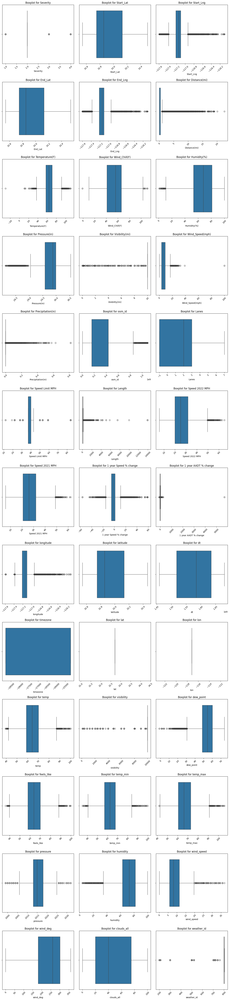

In [ ]:
# Create a boxplot for each numeric column - Outliers
# Select only numeric columns (float64 and int64)
numeric_df = final_df_copy.select_dtypes(include=['float64', 'int64'])

# Calculate the number of rows and columns dynamically based on the number of numeric columns
n_cols = 3  # Define number of columns
n_rows = math.ceil(len(numeric_df.columns) / n_cols)  # Calculate number of rows

# Create a boxplot for each numeric column
plt.figure(figsize=(15, n_rows * 5))  # Adjust height dynamically based on number of rows

for i, col in enumerate(numeric_df.columns, 1):
    plt.subplot(n_rows, n_cols, i)  # Adjust grid size dynamically
    sns.boxplot(data=final_df_copy, x=col)
    plt.title(f'Boxplot for {col}')
    plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

# Visualizing Distributions of Numeric Columns

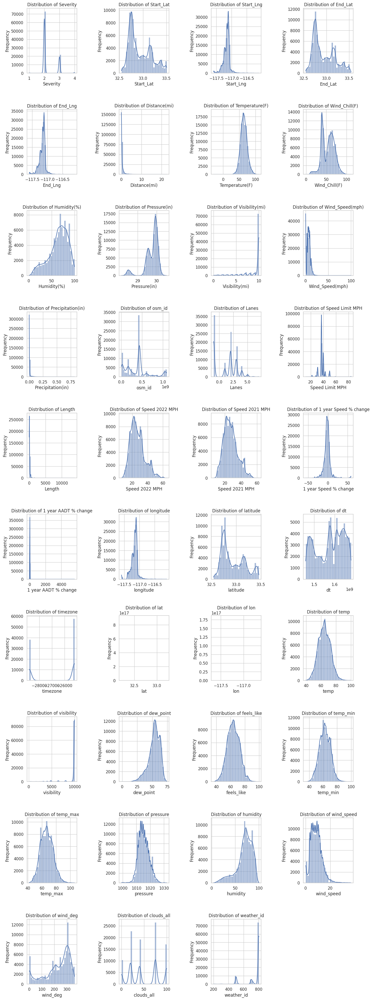

In [ ]:
# Histograms of numeric columns

# Set the style of the visualizations
sns.set(style='whitegrid')

# Calculate the number of rows and columns for subplots
num_columns = 4
num_rows = (len(numeric_df.columns) // num_columns) + 1

# Create histograms for each numeric column
plt.figure(figsize=(15, num_rows * 4))
for i, col in enumerate(numeric_df.columns, 1):
    plt.subplot(num_rows, num_columns, i)
    sns.histplot(numeric_df[col], bins=30, kde=True)
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')

plt.tight_layout(pad=4.0)
plt.show()

# Visualizing Counts for Categorical Columns

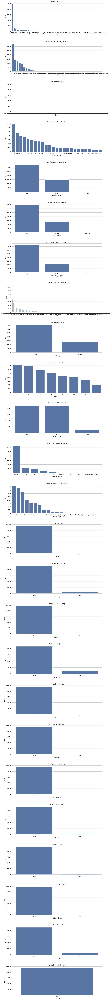

In [ ]:
categorical_columns = ['City', 'Weather_Condition', 'Street', 'Wind_Direction',
                       'Sunrise_Sunset', 'Civil_Twilight', 'Nautical_Twilight',
                       'Street Name', 'Highway', 'Direction', 'PeakPeriod',
                       'weather_main', 'weather_description', 'Bump', 'Crossing',
                       'Give_Way', 'Junction', 'No_Exit', 'Railway', 'Roundabout',
                       'Station', 'Stop', 'Traffic_Calming', 'Traffic_Signal',
                       'Turning_Loop']

# Set the style of the visualizations
sns.set(style='whitegrid')

# Create bar plots for each categorical column
plt.figure(figsize=(15, len(categorical_columns) * 5))
for i, col in enumerate(categorical_columns, 1):
    plt.subplot(len(categorical_columns), 1, i)
    sns.countplot(data=final_df_copy, x=col, order=final_df_copy[col].value_counts().index)
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Count')

plt.tight_layout(pad=4.0)
plt.show()

# Visualizing Numbers of Accidents per Year and Per Month Per Year


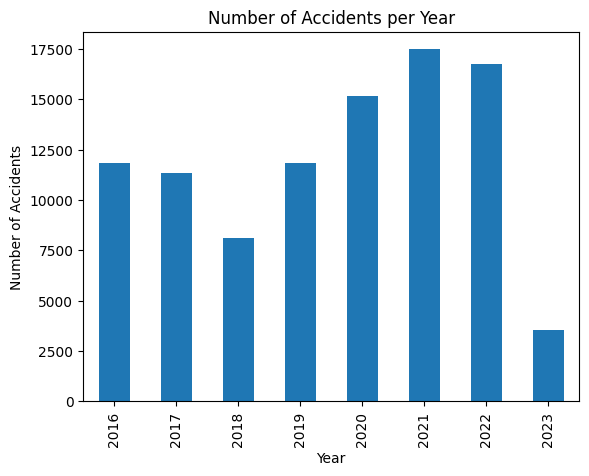

In [ ]:
# Extracting the year
final_df_copy['Year'] = final_df_copy['Start_Time'].dt.year

# Now you can count the number of accidents per year
accidents_per_year = final_df_copy['Year'].value_counts().sort_index()

# Plotting
import matplotlib.pyplot as plt
accidents_per_year.plot(kind='bar')
plt.xlabel('Year')
plt.ylabel('Number of Accidents')
plt.title('Number of Accidents per Year')
plt.show()

<ipython-input-27-bf234b4a9223>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_2023['Month'] = df_2023['Start_Time'].dt.month


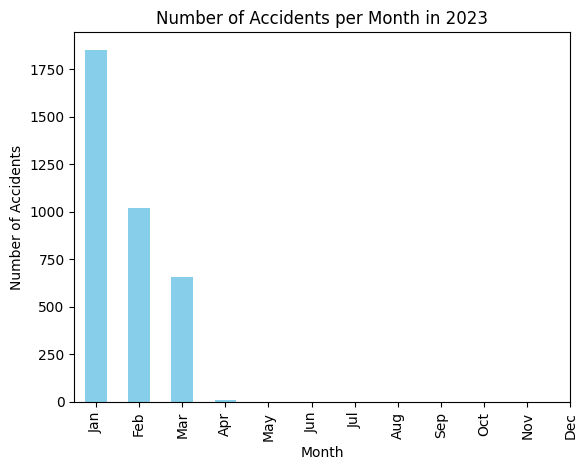

In [ ]:
# 2023 is only a partial year of data

# Filter data for the year 2023
df_2023 = final_df_copy[final_df_copy['Start_Time'].dt.year == 2023]

# Extract the month
df_2023['Month'] = df_2023['Start_Time'].dt.month

# Count the number of accidents per month
accidents_per_month_2023 = df_2023['Month'].value_counts().sort_index()

# Plotting the number of accidents per month
import matplotlib.pyplot as plt
accidents_per_month_2023.plot(kind='bar', color='skyblue')
plt.xlabel('Month')
plt.ylabel('Number of Accidents')
plt.title('Number of Accidents per Month in 2023')
plt.xticks(ticks=range(12), labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.show()

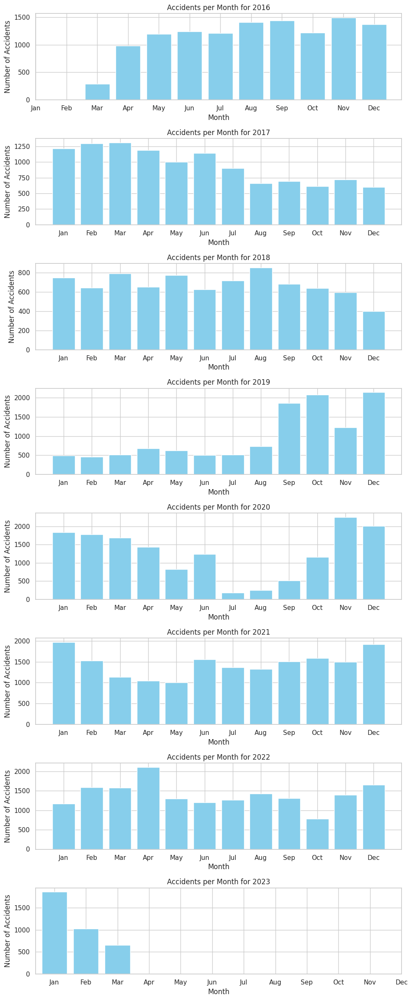

In [ ]:
# Loop through years 2016 to 2023
years = range(2016, 2024)  # 2024 is excluded, so it goes from 2016 to 2023

# Create a figure with subplots (one per year)
fig, axes = plt.subplots(nrows=len(years), ncols=1, figsize=(10, len(years) * 3))

# Loop through each year and create a bar plot for each
for idx, year in enumerate(years):
    # Filter data for the specific year
    df_year = final_df_copy[final_df_copy['Start_Time'].dt.year == year].copy()

    # Extract month from Start_Time
    df_year['Month'] = df_year['Start_Time'].dt.month

    # Count the number of accidents per month
    accidents_per_month = df_year['Month'].value_counts().sort_index()

    # Plotting for each year
    axes[idx].bar(accidents_per_month.index, accidents_per_month.values, color='skyblue')

    # Add titles and labels
    axes[idx].set_title(f'Accidents per Month for {year}')
    axes[idx].set_xlabel('Month')
    axes[idx].set_ylabel('Number of Accidents')
    axes[idx].set_xticks(range(1, 13))
    axes[idx].set_xticklabels(['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()



# Visualizing Accident Severity

In [ ]:
# Check the counts of unique values in the 'Severity' column
severity_counts = final_df_copy['Severity'].value_counts()

# Print the counts
print(severity_counts)

Severity
2    73238
3    21944
4      691
1      205
Name: count, dtype: int64


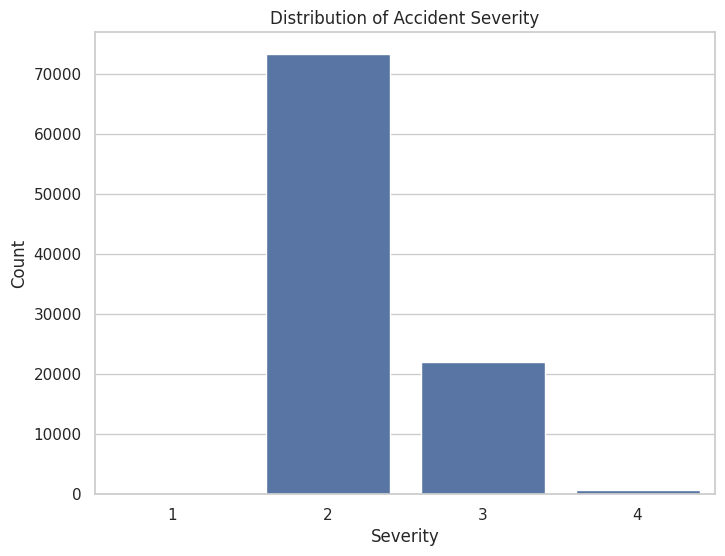

In [ ]:
# Visualize accident severity
plt.figure(figsize=(8, 6))
sns.countplot(x='Severity', data=final_df_copy)
plt.title('Distribution of Accident Severity')
plt.xlabel('Severity')
plt.ylabel('Count')
plt.show()

# Visualizing Weather Conditions

Weather_Condition
Fair                            32756
Clear                           13598
Mostly Cloudy                   12462
Cloudy                           9922
Partly Cloudy                    9472
Overcast                         4825
Light Rain                       3747
Scattered Clouds                 2963
Haze                             1888
Rain                             1309
Fog                              1118
Unknown                           916
Heavy Rain                        615
Light Drizzle                      62
Mostly Cloudy / Windy              50
Light Rain / Windy                 49
Fair / Windy                       41
Light Snow                         33
Heavy Rain / Windy                 31
Mist                               30
Thunder in the Vicinity            25
Rain / Windy                       20
T-Storm                            16
Light Rain with Thunder            15
Partly Cloudy / Windy              14
Cloudy / Windy                  

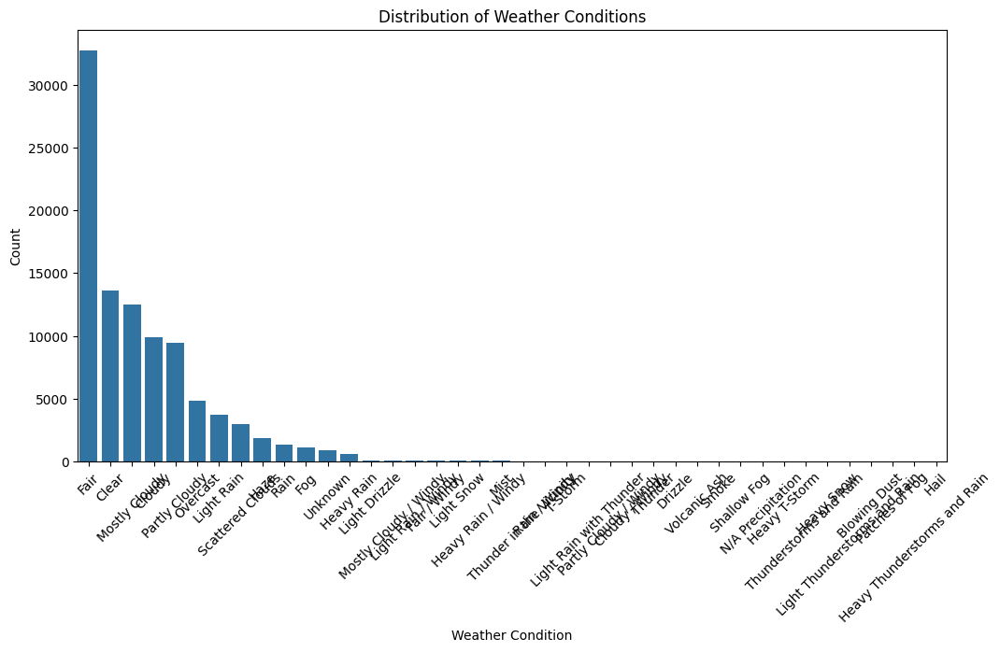

In [ ]:
# Count of weather conditions
weather_counts = final_df_copy['Weather_Condition'].value_counts()
print(weather_counts)

# Plot the weather conditions
plt.figure(figsize=(12, 6))
sns.countplot(x='Weather_Condition', data=final_df_copy, order=weather_counts.index)
plt.title('Distribution of Weather Conditions')
plt.xlabel('Weather Condition')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()

# Mapping Weather Conditions

In [ ]:
# Group weather conditions into broader categories
weather_mapping = {
    'Clear': 'Clear', 'Fair': 'Clear', 'Mostly Cloudy': 'Cloudy', 'Cloudy': 'Cloudy',
    'Partly Cloudy': 'Cloudy', 'Overcast': 'Cloudy', 'Light Rain': 'Rainy', 'Scattered Clouds': 'Cloudy',
    'Haze': 'Other', 'Rain': 'Rainy', 'Fog': 'Foggy', 'Unknown': 'Other',
    'Heavy Rain': 'Rainy', 'Light Drizzle': 'Rainy', 'Mostly Cloudy / Windy': 'Windy',
    'Light Rain / Windy': 'Windy', 'Fair / Windy': 'Windy', 'Light Snow': 'Snowy',
    'Heavy Rain / Windy': 'Windy', 'Mist': 'Other', 'Thunder in the Vicinity': 'Other',
    'Rain / Windy': 'Windy', 'T-Storm': 'Other', 'Light Rain with Thunder': 'Rainy',
    'Partly Cloudy / Windy': 'Windy', 'Cloudy / Windy': 'Windy', 'Thunder': 'Other',
    'Drizzle': 'Rainy', 'Volcanic Ash': 'Other', 'Smoke': 'Other', 'Shallow Fog': 'Foggy',
    'N/A Precipitation': 'Other', 'Heavy T-Storm': 'Other', 'Thunderstorms and Rain': 'Rainy',
    'Heavy Snow': 'Snowy', 'Light Thunderstorms and Rain': 'Rainy', 'Blowing Dust': 'Other',
    'Patches of Fog': 'Foggy', 'Heavy Thunderstorms and Rain': 'Rainy', 'Hail': 'Other'
}

# Apply the mapping
final_df_copy['Weather_Condition'] = final_df_copy['Weather_Condition'].map(weather_mapping)

# Check the new distribution of weather conditions
weather_counts = final_df_copy['Weather_Condition'].value_counts()
print(weather_counts)


Weather_Condition
Clear     46354
Cloudy    39644
Rainy      5767
Other      2929
Foggy      1129
Windy       219
Snowy        36
Name: count, dtype: int64


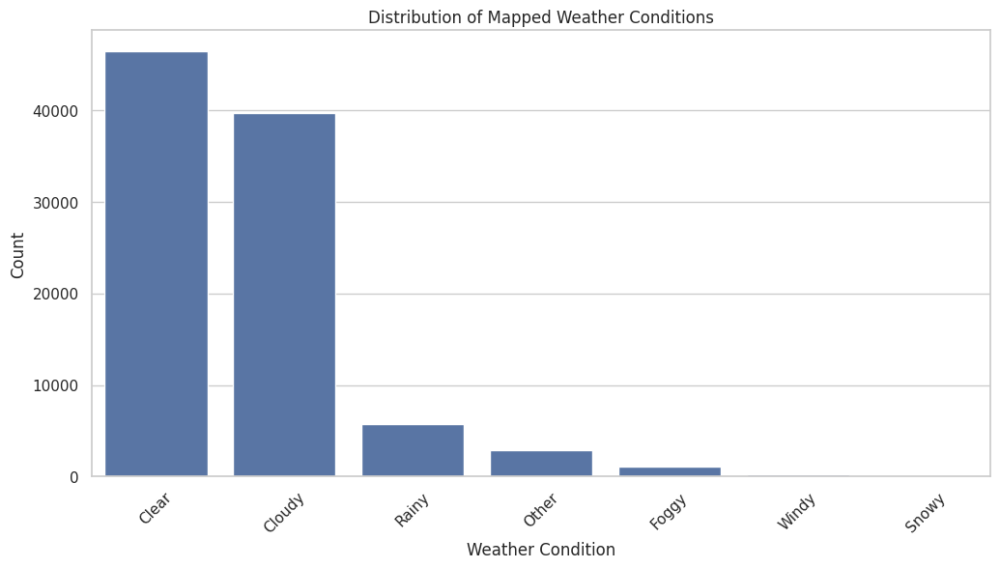

In [ ]:
# Plot the weather conditions
plt.figure(figsize=(12, 6))
sns.countplot(x='Weather_Condition', data=final_df_copy, order=weather_counts.index)
plt.title('Distribution of Mapped Weather Conditions')
plt.xlabel('Weather Condition')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()

# **Multivariate Graphical Analysis**

# Visualizing Severity of Accidents by Month by Year

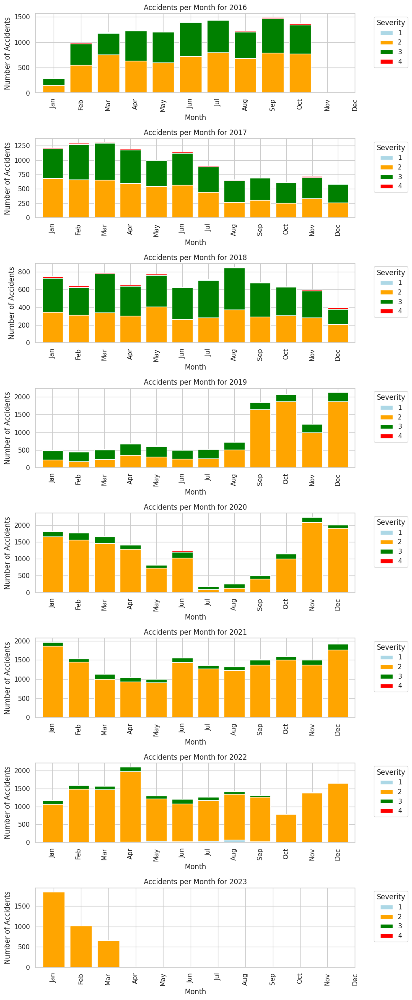

In [ ]:
# Define the severity levels and the colors to use (ensure consistent colors across years)
severity_levels = [1, 2, 3, 4]
colors = ['lightblue', 'orange', 'green', 'red']  # Color scheme for each severity level

# Loop through years 2016 to 2023
years = range(2016, 2024)  # 2024 is excluded, so it goes from 2016 to 2023

# Create a figure with subplots (one per year)
fig, axes = plt.subplots(nrows=len(years), ncols=1, figsize=(10, len(years) * 3))

# Loop through each year and create a bar plot for each
for idx, year in enumerate(years):
    # Filter data for the specific year
    df_year = final_df_copy[final_df_copy['Start_Time'].dt.year == year].copy()

    # Extract month from Start_Time
    df_year['Month'] = df_year['Start_Time'].dt.month

    # Group by month and severity and count the number of accidents
    accidents_per_month_severity = df_year.groupby(['Month', 'Severity']).size().unstack(fill_value=0)

    # Ensure all severity levels are included in the plot, even if missing
    accidents_per_month_severity = accidents_per_month_severity.reindex(columns=severity_levels, fill_value=0)

    # Plotting for each year with consistent colors
    accidents_per_month_severity.plot(kind='bar', stacked=True, ax=axes[idx], color=colors, width=0.8)

    # Add titles and labels
    axes[idx].set_title(f'Accidents per Month for {year}')
    axes[idx].set_xlabel('Month')
    axes[idx].set_ylabel('Number of Accidents')
    axes[idx].set_xticks(range(0, 12))
    axes[idx].set_xticklabels(['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])

    # Move the legend off the chart
    axes[idx].legend(title='Severity', bbox_to_anchor=(1.05, 1), loc='upper left')

# Adjust layout to prevent overlap and make room for the legend
plt.tight_layout()
plt.show()


# Visualizing Accidents by Location and Weather Condition

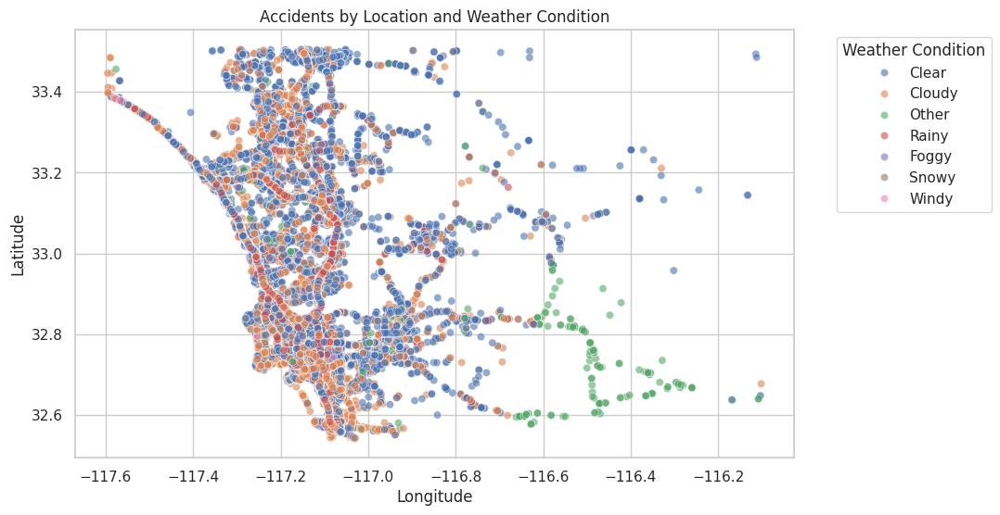

In [ ]:
# Scatter plot of accident locations (latitude and longitude)
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Start_Lng', y='Start_Lat', data=final_df_copy, hue='Weather_Condition', alpha=0.6)
plt.title('Accidents by Location and Weather Condition')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.legend(title='Weather Condition', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()


In [ ]:
# Define a center location for San Diego (latitude, longitude)
san_diego_lat, san_diego_lng = 32.7157, -117.1611

# Create a folium map centered around San Diego
map_san_diego = folium.Map(location=[san_diego_lat, san_diego_lng], zoom_start=12)

# Manually define weather conditions and their corresponding colors
weather_conditions = {
    'Clear': '#66c2a5',
    'Cloudy': '#fc8d62',
    'Rain': '#8da0cb',
    'Fog': '#e78ac3',
    'Snow': '#a6d854',
    'Wind': '#ffd92f',
    'Other': '#e5c494',
    'Unknown': '#b3b3b3',
}

# Loop through the DataFrame and add a marker for each accident
for _, row in final_df_copy.iterrows():
    # Get the location and weather condition
    lat = row['Start_Lat']
    lng = row['Start_Lng']
    weather_condition = row['Weather_Condition']

    # Choose a color based on weather condition
    color = weather_conditions.get(weather_condition, '#b3b3b3')  # Default to gray if not found

    # Add a circle marker on the map with a larger radius for better visibility
    folium.CircleMarker(
        location=[lat, lng],
        radius=4,  # Increase the radius for better visibility
        color=color,
        fill=True,
        fill_color=color,
        fill_opacity=0.6,
        popup=f"Weather: {weather_condition}",
    ).add_to(map_san_diego)

# Add a color legend (manually, since folium doesn't have a built-in legend function)
legend_html = '''
    <div style="position: fixed;
                bottom: 30px; left: 30px; width: 220px; height: 140px;
                background-color: white; border:2px solid grey;
                border-radius: 3px; z-index: 9999; font-size:14px; padding: 10px;">
        <b>Weather Condition Legend</b><br>
'''

# Add each weather condition and its color to the legend
for condition, color in weather_conditions.items():
    legend_html += f'<i style="background:{color}; width: 12px; height: 12px; display: inline-block; margin-right: 10px;"></i>{condition}<br>'

legend_html += '</div>'

# Add the legend to the map
map_san_diego.get_root().html.add_child(folium.Element(legend_html))

# Display the map
map_san_diego

Buffered data was truncated after reaching the output size limit.

In [ ]:
# Save the map to an HTML file
map_san_diego.save("san_diego_accidents_map.html")

# Visualizing Severity based on Location

In [ ]:
# Define a center location for San Diego (latitude, longitude)
san_diego_lat, san_diego_lng = 32.7157, -117.1611

# Create a folium map centered around San Diego
map_san_diego_severity = folium.Map(location=[san_diego_lat, san_diego_lng], zoom_start=12)

# Manually define severity levels and their corresponding colors (using integers for severity levels)
severity_levels = {
    1: '#66c2a5',  # Low severity
    2: '#fc8d62',  # Moderate severity
    3: '#e78ac3',  # High severity
    4: '#a6d854',  # Severe severity
}

# Loop through the DataFrame and add a marker for each accident
for _, row in final_df_copy.iterrows():
    # Ensure the latitude and longitude are not NaN
    if pd.notnull(row['Start_Lat']) and pd.notnull(row['Start_Lng']):
        lat = row['Start_Lat']
        lng = row['Start_Lng']
        severity = row['Severity']

        # Ensure the severity level is an integer (if needed)
        severity = int(severity)

        # Choose a color based on severity level
        color = severity_levels.get(severity, '#b3b3b3')  # Default to gray if not found

        # Add a circle marker on the map with a larger radius for better visibility
        folium.CircleMarker(
            location=[lat, lng],
            radius=4,
            color=color,
            fill=True,
            fill_color=color,
            fill_opacity=0.6,
            popup=f"Severity: {severity}",
        ).add_to(map_san_diego_severity)

# Add a color legend (manually, since folium doesn't have a built-in legend function)
legend_html = '''
    <div style="position: fixed;
                bottom: 30px; left: 30px; width: 220px; height: 140px;
                background-color: white; border:2px solid grey;
                border-radius: 3px; z-index: 9999; font-size:14px; padding: 10px;">
        <b>Severity Level Legend</b><br>
'''

# Add each severity level and its color to the legend
for severity, color in severity_levels.items():
    legend_html += f'<i style="background:{color}; width: 12px; height: 12px; display: inline-block; margin-right: 10px;"></i>{severity}<br>'

legend_html += '</div>'

# Add the legend to the map
map_san_diego_severity.get_root().html.add_child(folium.Element(legend_html))

# Display the map
map_san_diego_severity


Buffered data was truncated after reaching the output size limit.

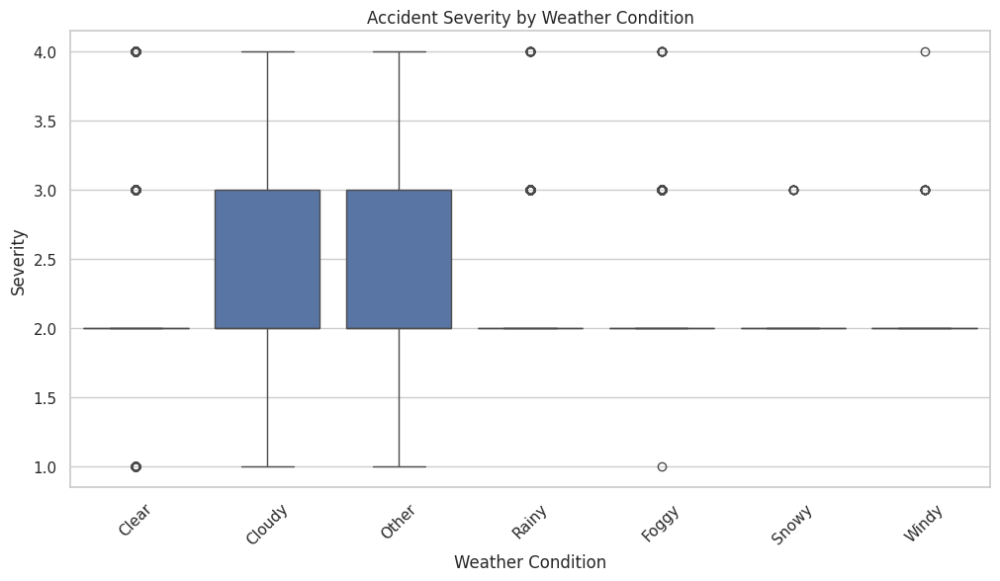

In [ ]:
# Box plot to analyze severity by weather condition
plt.figure(figsize=(12, 6))
sns.boxplot(x='Weather_Condition', y='Severity', data=final_df_copy)
plt.title('Accident Severity by Weather Condition')
plt.xlabel('Weather Condition')
plt.ylabel('Severity')
plt.xticks(rotation=45)
plt.show()


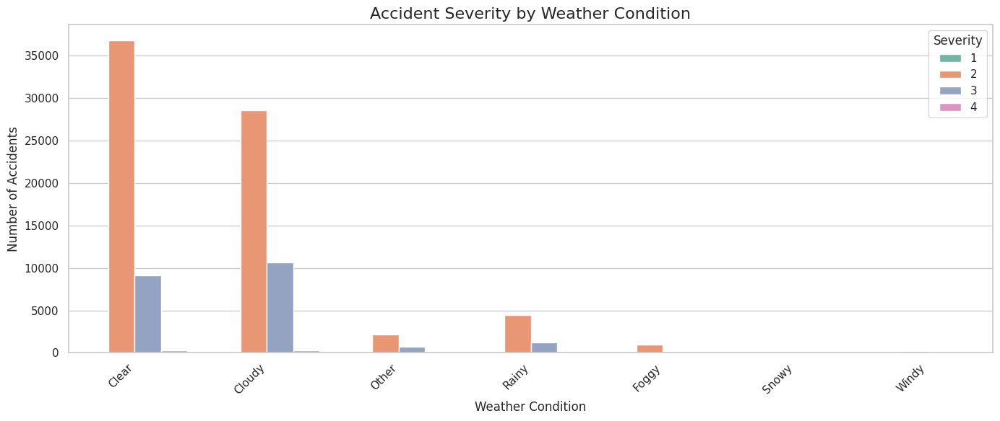

In [ ]:
# Create a countplot
plt.figure(figsize=(14, 6))
sns.countplot(x='Weather_Condition', hue='Severity', data=final_df_copy, palette='Set2')

# Customize the plot
plt.title('Accident Severity by Weather Condition', fontsize=16)
plt.xlabel('Weather Condition', fontsize=12)
plt.ylabel('Number of Accidents', fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.tight_layout()

# Show the plot
plt.show()


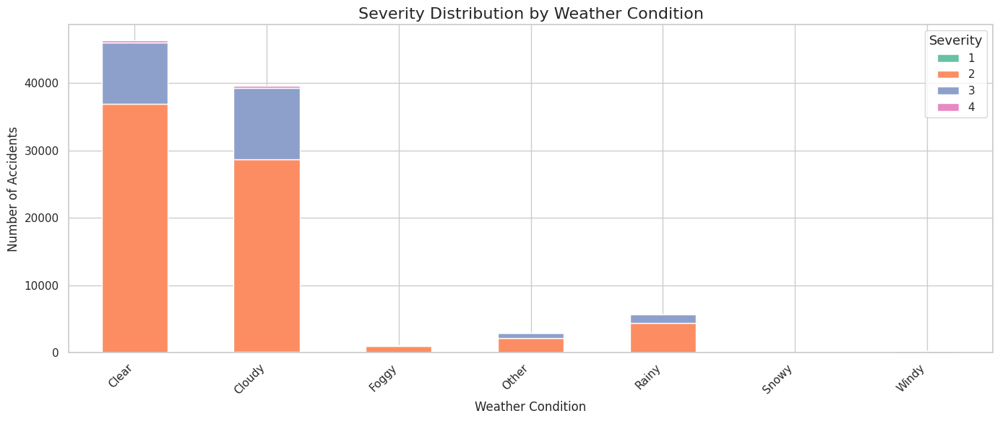

In [ ]:
# Create a cross-tabulation of 'Weather_Condition' and 'Severity'
severity_by_weather = pd.crosstab(final_df_copy['Weather_Condition'], final_df_copy['Severity'])

# Plot the stacked bar plot
severity_by_weather.plot(kind='bar', stacked=True, figsize=(14, 6), color=sns.color_palette('Set2'))

# Customize the plot
plt.title('Severity Distribution by Weather Condition', fontsize=16)
plt.xlabel('Weather Condition', fontsize=12)
plt.ylabel('Number of Accidents', fontsize=12)
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better readability
plt.legend(title='Severity', title_fontsize='13', fontsize='11')
plt.tight_layout()

# Show the plot
plt.show()


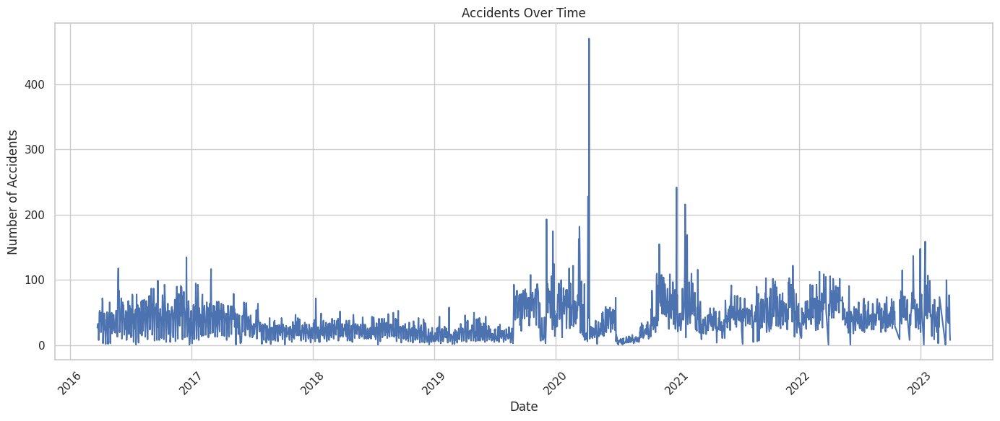

In [ ]:
# Group by date and count occurrences
accidents_by_date = final_df_copy['Start_Time'].dt.date.value_counts().sort_index()

plt.figure(figsize=(14, 6))
plt.plot(accidents_by_date.index, accidents_by_date.values)
plt.title('Accidents Over Time')
plt.xlabel('Date')
plt.ylabel('Number of Accidents')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

<ipython-input-30-d3eb0199bdea>:19: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


<Figure size 1400x600 with 0 Axes>

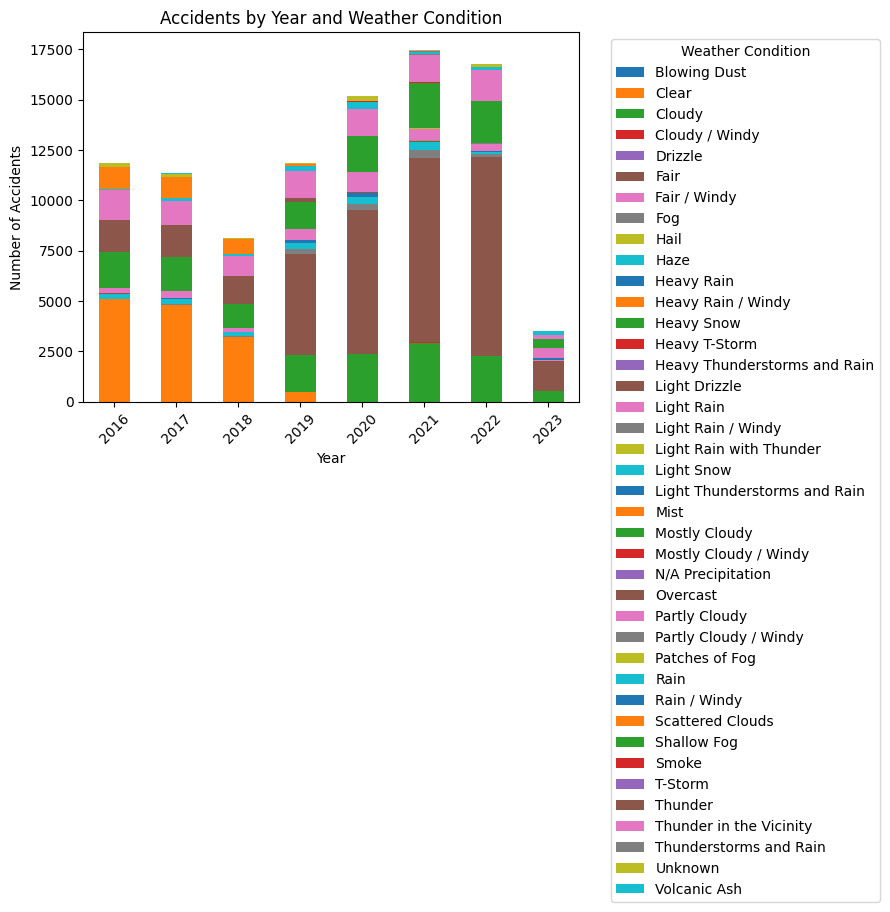

In [ ]:
# Add columns for year and month if not already available
final_df_copy['Year'] = final_df_copy['Start_Time'].dt.year
final_df_copy['Month'] = final_df_copy['Start_Time'].dt.month

# Accidents by year and weather condition
accidents_by_year_weather = final_df_copy.groupby(['Year', 'Weather_Condition']).size().unstack()

# Plot
plt.figure(figsize=(14, 6))
ax = accidents_by_year_weather.plot(kind='bar', stacked=True)
plt.title('Accidents by Year and Weather Condition')
plt.xlabel('Year')
plt.ylabel('Number of Accidents')
plt.xticks(rotation=45)

# Move the legend off the chart
plt.legend(title='Weather Condition', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()


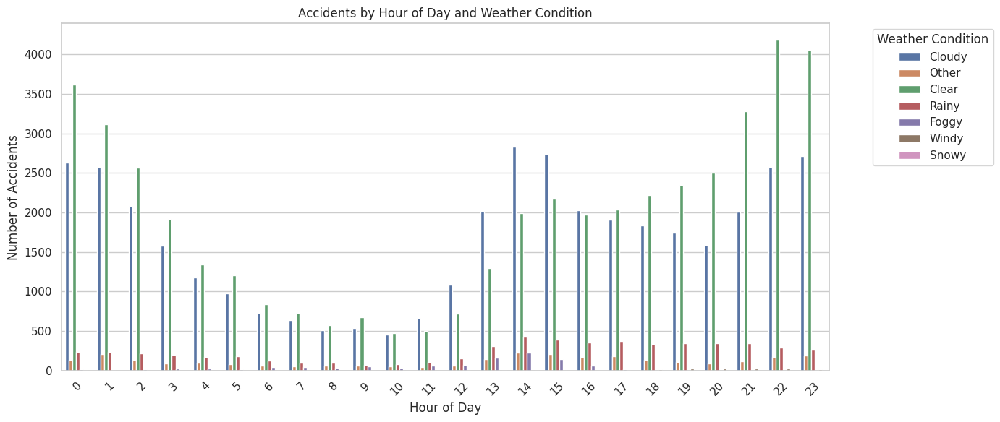

In [ ]:
# Extract hour of day
final_df_copy['Hour'] = final_df_copy['Start_Time'].dt.hour

# Plot accidents by hour and weather condition
plt.figure(figsize=(14, 6))
sns.countplot(x='Hour', hue='Weather_Condition', data=final_df_copy)
plt.title('Accidents by Hour of Day and Weather Condition')
plt.xlabel('Hour of Day')
plt.ylabel('Number of Accidents')
plt.xticks(rotation=45)

# Move the legend off the chart
plt.legend(title='Weather Condition', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()



<Figure size 1400x600 with 0 Axes>

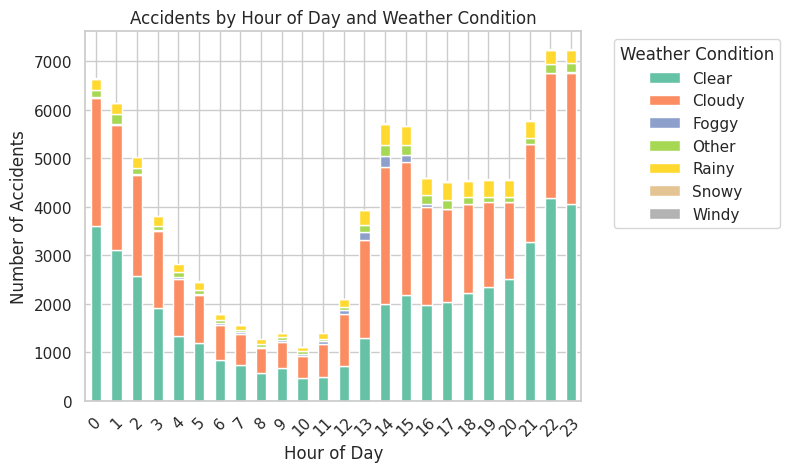

In [ ]:
# Group accidents by weather condition and hour
weather_hour = final_df_copy.groupby(['Hour', 'Weather_Condition']).size().unstack()

# Plot the result
plt.figure(figsize=(14, 6))
weather_hour.plot(kind='bar', stacked=True, colormap='Set2')
plt.title('Accidents by Hour of Day and Weather Condition')
plt.xlabel('Hour of Day')
plt.ylabel('Number of Accidents')
plt.xticks(rotation=45)
plt.legend(title='Weather Condition', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()


In [ ]:
# Pair plot to visualize relationships between numerical variables
pairplot_columns = ['Severity', 'Temperature(F)', 'Wind_Speed(mph)', 'Humidity(%)', 'Weather_Condition']

# Creating the pair plot
sns.pairplot(final_df_copy[pairplot_columns], hue='Weather_Condition', palette='viridis')

# Adjust the title to avoid overlap with the plot
plt.title('Pair Plot of Accident Severity, Weather, and Weather Conditions', loc='left', pad=20)
plt.show()



# **Multivariate Non-Graphical Analysis**

In [ ]:
# Cross-tabulation between 'Weather Condition' and 'Accident Severity'
pd.crosstab(final_df_copy['Weather_Condition'], final_df_copy['Severity'])

In [ ]:
# Perform ANOVA test between different weather conditions and accident severity
weather_conditions = final_df_copy['Weather_Condition'].unique()
severity_by_weather = [final_df_copy[final_df_copy['Weather_Condition'] == condition]['Severity'] for condition in weather_conditions]

f_statistic, p_value = stats.f_oneway(*severity_by_weather)
print(f'ANOVA test statistic: {f_statistic}, p-value: {p_value}')

The F-statistic is 112.78, which indicates a large difference between the group means relative to the variability within the groups.
A higher F-value suggests that the variance between the groups is much larger than the variance within the groups, which typically points to a significant effect.

Since the p-value is so small (far below the commonly used threshold of 0.05), we reject the null hypothesis. This means there is strong statistical evidence that at least one group mean differs significantly from the others.

In [ ]:
# Perform the Tukey HSD test
# Fit the model
model = ols('Severity ~ C(Weather_Condition)', data=final_df_copy).fit()

# Perform Tukey's HSD test
tukey_result = pairwise_tukeyhsd(endog=final_df_copy['Severity'],
                                 groups=final_df_copy['Weather_Condition'],
                                 alpha=0.05)

# Print the result
print(tukey_result)

Significant Differences (Rejecting Null Hypothesis):

Clear vs. Cloudy: Clear weather leads to significantly more accidents than Cloudy weather (mean difference = 0.0738).

Clear vs. Foggy: Clear weather leads to significantly more accidents than Foggy weather (mean difference = -0.0494).

Clear vs. Other: Clear weather has significantly more accidents compared to the "Other" weather condition (mean difference = 0.0656).

Clear vs. Rainy: Clear weather leads to more accidents than Rainy weather (mean difference = 0.0203).

Clear vs. Windy: Clear weather has fewer accidents than Windy weather (mean difference = -0.1486).

Cloudy vs. Foggy: Cloudy weather leads to significantly fewer accidents than Foggy weather (mean difference = -0.1231).

Cloudy vs. Rainy: Cloudy weather leads to significantly fewer accidents than Rainy weather (mean difference = -0.0535).

Cloudy vs. Windy: Cloudy weather has fewer accidents than Windy weather (mean difference = -0.2223).

Foggy vs. Other: Foggy weather leads to significantly more accidents than the "Other" weather condition (mean difference = 0.1149).

Foggy vs. Rainy: Foggy weather leads to significantly more accidents than Rainy weather (mean difference = 0.0696).

Foggy vs. Windy: Foggy weather has fewer accidents than Windy weather (mean difference = -0.0992).

Other vs. Rainy: The "Other" weather condition has significantly more accidents than Rainy weather (mean difference = -0.0453).

Other vs. Windy: The "Other" weather condition has significantly fewer accidents than Windy weather (mean difference = -0.2141).

Rainy vs. Windy: Rainy weather has significantly fewer accidents than Windy weather (mean difference = -0.1688).

In [ ]:
# Compute correlation between numerical features and severity
numerical_features = final_df_copy.select_dtypes(include=['float64', 'int64'])

# Calculate the correlation with all numerical features
correlation = numerical_features.corr()['Severity'].sort_values(ascending=False)

# Display the correlations
correlation

In [ ]:
# Calculate the correlation matrix
correlation_matrix = numeric_df.corr()

# Visualize the correlation matrix using a heatmap
plt.figure(figsize=(16, 12))  # Larger figure size
sns.heatmap(correlation_matrix, annot=True, fmt='.2f', cmap='coolwarm', square=True,
            annot_kws={'size': 12},  # Increase font size of annotations
            cbar_kws={'shrink': 0.8},  # Adjust color bar size
            linewidths=0.5,  # Add lines between the cells for better separation
            xticklabels=correlation_matrix.columns,  # Make sure column labels are readable
            yticklabels=correlation_matrix.columns)  # Make sure row labels are readable

# Rotate x and y axis labels to avoid overlap
plt.xticks(rotation=45, ha='right', fontsize=10)
plt.yticks(rotation=0, fontsize=10)

plt.title('Correlation Heatmap', fontsize=14)
plt.tight_layout()  # Adjust layout to ensure everything fits without overlap
plt.show()

In [ ]:
# Calculate the correlation matrix
correlation_matrix = numeric_df.corr()

# Mask the correlations below 0.6 (set them to NaN)
mask = correlation_matrix < 0.6
filtered_correlation_matrix = correlation_matrix.where(~mask)

# Visualize the filtered correlation matrix using a heatmap
plt.figure(figsize=(16, 12))  # Larger figure size
sns.heatmap(filtered_correlation_matrix, annot=True, fmt='.2f', cmap='coolwarm', square=True,
            annot_kws={'size': 12},  # Increase font size of annotations
            cbar_kws={'shrink': 0.8},  # Adjust color bar size
            linewidths=0.5,  # Add lines between the cells for better separation
            xticklabels=filtered_correlation_matrix.columns,  # Make sure column labels are readable
            yticklabels=filtered_correlation_matrix.columns)  # Make sure row labels are readable

# Rotate x and y axis labels to avoid overlap
plt.xticks(rotation=45, ha='right', fontsize=10)
plt.yticks(rotation=0, fontsize=10)

plt.title('Filtered Correlation Heatmap (Greater than 0.6)', fontsize=14)
plt.tight_layout()  # Adjust layout to ensure everything fits without overlap
plt.show()


In [ ]:
# Calculate the correlation matrix
correlation_matrix = numeric_df.corr()

# Mask the upper triangle
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))

# Visualize the correlation matrix using a heatmap (lower triangle only)
plt.figure(figsize=(18, 14))  # Larger figure size
sns.heatmap(correlation_matrix, annot=True, fmt='.2f', cmap='coolwarm', square=True,
            annot_kws={'size': 8},
            cbar_kws={'shrink': 0.8},  # Adjust color bar size
            linewidths=0.5,  # Add lines between the cells for better separation
            xticklabels=correlation_matrix.columns,  # Make sure column labels are readable
            yticklabels=correlation_matrix.columns,  # Make sure row labels are readable
            mask=mask)  # Apply mask to display only the lower triangle

# Rotate x and y axis labels to avoid overlap
plt.xticks(rotation=45, ha='right', fontsize=10)
plt.yticks(rotation=0, fontsize=10)

plt.title('Correlation Heatmap (Lower Triangle)', fontsize=14)
plt.tight_layout()  # Adjust layout to ensure everything fits without overlap
plt.show()

# Feature Importance

In [44]:
# Drop irrelevant columns and columns not suitable for model training
drop_columns = ['ID', 'Source', 'Start_Time', 'End_Time', 'Description', 'Street', 'City', 'County',
                'State', 'Zipcode', 'Country', 'Timezone', 'Airport_Code', 'Weather_Timestamp',
                'Weather_Condition', 'Amenity', 'Bump', 'Crossing', 'Give_Way', 'Junction', 'No_Exit',
                'Railway', 'Roundabout', 'Station', 'Stop', 'Traffic_Calming', 'Traffic_Signal',
                'Turning_Loop', 'Sunrise_Sunset', 'Civil_Twilight', 'Nautical_Twilight',
                'Astronomical_Twilight', 'osm_id', 'Street Name', 'Highway', 'Direction',
                'PeakPeriod', 'geometry', 'longitude', 'latitude', 'dt', 'dt_iso', 'timezone',
                'city_name', 'lat', 'lon', 'weather_id', 'weather_main', 'weather_description', 'weather_icon']
df_cleaned = final_df_copy.drop(columns=drop_columns)

# Convert categorical variables into one-hot encoded columns
df_cleaned = pd.get_dummies(df_cleaned, drop_first=True)

# Convert boolean columns to 0 or 1
boolean_columns = df_cleaned.select_dtypes(include='bool').columns
df_cleaned[boolean_columns] = df_cleaned[boolean_columns].astype(int)

# Define target and features
X = df_cleaned.drop(columns=['Severity'])
y = df_cleaned['Severity']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize the RandomForestClassifier
rf = RandomForestClassifier(n_estimators=100, random_state=42)

# Train the model
rf.fit(X_train, y_train)

# Get feature importance
feature_importances = rf.feature_importances_

# Create a DataFrame to display feature importance
feature_importance_df = pd.DataFrame({
    'Feature': X.columns,
    'Importance': feature_importances
})

# Sort the features by importance
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

# Visualize the top 20 features
plt.figure(figsize=(12, 8))
sns.barplot(x='Importance', y='Feature', data=feature_importance_df.head(20))  # Top 20 features
plt.title('Top 20 Features Impacting Accident Severity')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.show()

NameError: name 'final_df_copy' is not defined

Polynomial transformation for continuous variables

In [ ]:
# Identify categorical columns as those not in continuous_columns
categorical_columns = df_cleaned.columns.difference(continuous_columns).tolist()

# Create DataFrame with continuous variables
df_continuous = df_cleaned[continuous_columns]

# Create dummy variables for the remaining columns (categorical or others)
df_categorical_dummies = pd.get_dummies(
    df_cleaned[categorical_columns],
    drop_first=True,  # Avoid multicollinearity by dropping the first category
    dtype=float       # Ensure numerical consistency
)

# Combine continuous variables with dummy variables
final_df = pd.concat([df_continuous, df_categorical_dummies], axis=1)
final_df.head()

In [ ]:
# Initialize PolynomialFeatures
poly = PolynomialFeatures(degree=2, include_bias=False)

# Function to process columns in batches
def process_columns_in_batches(df, batch_size=10):
    # Create an empty list to store the transformed batches
    transformed_batches = []

    # Get the columns of the DataFrame
    columns = df.columns

    # Split the columns into batches
    num_batches = int(np.ceil(len(columns) / batch_size))

    for i in range(num_batches):
        # Select the current batch of columns
        batch_columns = columns[i * batch_size: (i + 1) * batch_size]
        batch_df = df[batch_columns]

        # Apply the transformation to the batch of columns
        transformed_batch = poly.fit_transform(batch_df)

        # Convert the transformed batch into a DataFrame
        transformed_batch_df = pd.DataFrame(
            transformed_batch,
            columns=poly.get_feature_names_out(batch_columns)
        )

        # Append the transformed batch to the list
        transformed_batches.append(transformed_batch_df)

    # Concatenate all transformed batches into a single DataFrame
    transformed_df = pd.concat(transformed_batches, axis=1)

    return transformed_df

# Example usage with your DataFrame (final_df)
transformed_df = process_columns_in_batches(final_df)

In [ ]:
# Visualize pairwise relationships for the first few polynomial features
sns.pairplot(transformed_df.iloc[:, :5])
plt.suptitle('Pairwise Relationships of Polynomial Features', y=1.02)
plt.show()

Get skewness and normalize skewed variables

In [43]:
# Process columns in batches
batch_size = 10  # Define the batch size for columns
columns = transformed_df.columns.tolist()

for i in range(0, len(columns), batch_size):
    batch_columns = columns[i:i + batch_size]
    batch_df = transformed_df[batch_columns]  # Select a batch of columns

    # Calculate skewness for the batch
    skewness = batch_df.skew()

    for column, skew_value in skewness.items():
        if abs(skew_value) > 0.5:  # Threshold for skewness
            #print(f"Processing column '{column}' with skewness {skew_value:.2f}")
            # Apply transformations
            if skew_value > 0:
                transformed_df[column] = np.log1p(transformed_df[column].clip(lower=0))  # Vectorized log1p
            else:
                transformed_df[column] = (1 / (transformed_df[column] + 1)).replace([np.inf, -np.inf], 0)  # Vectorized inverse

    # Clean up memory
    del batch_df
    gc.collect()

NameError: name 'transformed_df' is not defined

Encode variables to find stronger relationships to Severity

In [42]:
import warnings
from pandas.errors import PerformanceWarning

# Define the target variable
target = 'Severity'
features = transformed_df.drop(columns=[target]).columns.tolist()

# Initialize an empty DataFrame to store target-encoded features
target_encoded_features = pd.DataFrame()

# Process columns in batches
batch_size = 10  # Define batch size for memory efficiency
for i in range(0, len(features), batch_size):
    batch_columns = features[i:i + batch_size]

    for column in batch_columns:
        # Suppress the specific performance warning
        with warnings.catch_warnings():
            warnings.simplefilter("ignore", category=PerformanceWarning)

            # Group by column and calculate mean of the target variable
            target_means = transformed_df.groupby(column)[target].mean()

            # Map the target means to the original feature column
            encoded_column = transformed_df[column].map(target_means)

            # Add the target-encoded column to the result DataFrame
            target_encoded_features[f"{column}_target_encoded"] = encoded_column

    # Clean up memory after processing the batch
    gc.collect()


NameError: name 'transformed_df' is not defined

In [ ]:
# Add the target variable to the target-encoded DataFrame
target_encoded_features[target] = transformed_df[target]

# Inspect the resulting DataFrame
target_encoded_features.head()

In [ ]:
target_encoded_features.shape

PCA for dimensionality reduction

In [41]:
# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(target_encoded_features.drop(columns=['Severity']))

# Initialize IncrementalPCA
n_components_to_check = min(50, X_scaled.shape[1])  # Limit to 50 components for exploration
ipca = IncrementalPCA(n_components=n_components_to_check, batch_size=100)

# Fit IncrementalPCA
X_ipca = ipca.fit_transform(X_scaled)

NameError: name 'target_encoded_features' is not defined

In [ ]:
# Plot the cumulative explained variance ratio
plt.figure(figsize=(10, 6))
plt.plot(range(1, len(ipca.explained_variance_ratio_) + 1),
         ipca.explained_variance_ratio_.cumsum(), marker='o', linestyle='--')
plt.title('Cumulative Explained Variance by Number of Principal Components (IncrementalPCA)')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance')
plt.grid()
plt.show()

In [ ]:
# Select the number of components for the desired variance
variance_threshold = 0.89
n_components = next(i for i, cumulative_variance in enumerate(ipca.explained_variance_ratio_.cumsum()) if cumulative_variance >= variance_threshold) + 1
print(f"Number of components to retain for {variance_threshold*100}% variance: {n_components}")

In [ ]:
# Transform data using IncrementalPCA with selected number of components
ipca_reducer = IncrementalPCA(n_components=n_components, batch_size=100)
X_reduced = ipca_reducer.fit_transform(X_scaled)

In [ ]:
# Get the column names from target_encoded_features (excluding the target variable 'Severity')
original_feature_names = target_encoded_features.drop(columns=['Severity']).columns.tolist()

# Create a DataFrame for the reduced data (96,078 rows and n_components columns)
X_reduced_df = pd.DataFrame(
    X_reduced
)

In [40]:
# Get the absolute value of the loadings for each principal component
loadings_abs = ipca_reducer.components_.T
loadings_abs = abs(loadings_abs)

# Convert the loadings_abs array to a pandas DataFrame for easier manipulation
loadings_abs_df = pd.DataFrame(loadings_abs, index=original_feature_names)

# Find the most important feature for each principal component (the feature with the largest absolute loading)
top_features_per_component = loadings_abs_df.idxmax(axis=0)

# Display the features for the retained components
print(f"Top contributing features for each of the {n_components} principal components:")

# Replace PC names with the corresponding most important feature names
top_feature_names = [top_features_per_component[i] for i in range(n_components)]

# Update the column names in X_reduced_df with the top feature names
X_reduced_df.columns = top_feature_names

# Add the 'Severity' column from the original dataset to the reduced features DataFrame
X_reduced_df['Severity'] = target_encoded_features['Severity']

# Display the updated DataFrame with the new column names
X_reduced_df.head()

NameError: name 'ipca_reducer' is not defined

In [ ]:
# Save the PCA-reduced dataset
X_reduced_df.to_csv('/content/drive/MyDrive/Capstone/Data/pca_reduced_features.csv', index=False)

# Data Partitioning

## Pre Cleanup & Prep Data

In [ ]:
# Define target variable
y_pre = df_cleaned['Severity']

# Define features
X_pre = df_cleaned.drop(columns=['Severity'])

In [ ]:
# Confirm shape of y (target variable)
y_pre.shape

In [ ]:
# Confirm shape of X (features)
X_pre.shape

In [ ]:
# Split data into training and temporary (validation + test)
X_train_pre, X_temp_pre, y_train_pre, y_temp_pre = train_test_split(X_pre, y_pre, test_size=0.3, random_state=42)

# Further split temporary data into validation and test
X_val_pre, X_test_pre, y_val_pre, y_test_pre = train_test_split(X_temp_pre, y_temp_pre, test_size=0.5, random_state=42)

In [ ]:
# Confirm shape of splits
print(f"Training set: {X_train_pre.shape}, {y_train_pre.shape}")
print(f"Validation set: {X_val_pre.shape}, {y_val_pre.shape}")
print(f"Test set: {X_test_pre.shape}, {y_test_pre.shape}")

## Post Cleanup & Prep Data

In [4]:
# File path for modeling data
input_path_modeling = '/content/drive/MyDrive/Capstone/Data/modeling_data.csv'
# input_path_modeling = '/content/drive/MyDrive/Capstone/Data/pca_reduced_features.csv'

# Read the CSV file into a DataFrame
modeling_df = pd.read_csv(input_path_modeling)

# Display the first few rows to confirm the data has been loaded
modeling_df.head()

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,...,PC42,PC43,PC44,PC45,PC46,PC47,PC48,PC49,PC50,Severity
0,1.589312,-1.840252,1.291855,-0.026065,-0.565245,-0.158553,0.896117,0.152438,1.241301,2.404597,...,-0.388007,0.594385,0.590930,-0.298451,0.663280,0.401162,-0.338078,0.691323,0.177916,1.098612
1,1.652919,-3.035669,-2.047590,-0.822837,-0.032776,-0.276946,0.822338,-0.119850,0.987801,-0.070593,...,0.857314,0.164907,-0.560115,-0.200583,-0.756591,-0.665881,-0.056079,-0.406218,-0.872971,1.098612
2,5.422831,1.152780,0.681008,0.139302,2.726058,-1.764425,1.574041,-0.488585,-2.092834,2.072538,...,3.881291,-0.496839,-1.495057,-2.440145,-0.544518,-2.070637,0.332142,-1.383729,-1.531084,1.609438
3,1.264266,-0.523847,-1.727830,-1.377395,0.748902,-1.543631,1.739284,0.453388,1.395310,-0.592098,...,0.987277,0.865360,-0.517628,-0.683830,-1.269911,-1.739699,0.605440,0.226225,-0.513032,1.098612
4,4.496113,0.664579,-0.332219,1.612818,0.081253,-1.429524,1.707372,1.056062,-1.731042,2.426222,...,-1.274576,-0.644778,0.033705,-2.255816,0.304859,0.241764,0.517539,-1.279336,0.468942,1.386294


In [5]:
# Define target variable
y = modeling_df['Severity']

# Define features
X = modeling_df.drop(columns=['Severity'])

In [27]:
# Confirm shape of y (target variable)
y.shape

(96078,)

In [ ]:
# Confirm shape of X (features)
X.shape

(96078, 50)

In [6]:
# Split data into training and temporary (validation + test)
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.3, random_state=42)

# Further split temporary data into validation and test
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)

In [ ]:
# Confirm shape of splits
print(f"Training set: {X_train.shape}, {y_train.shape}")
print(f"Validation set: {X_val.shape}, {y_val.shape}")
print(f"Test set: {X_test.shape}, {y_test.shape}")

Training set: (67254, 50), (67254,)
Validation set: (14412, 50), (14412,)
Test set: (14412, 50), (14412,)


In [7]:
# Scale y varibale
target_scaler = MinMaxScaler()
y_train_scaled = target_scaler.fit_transform(y_train.values.reshape(-1, 1))
y_val_scaled = target_scaler.transform(y_val.values.reshape(-1, 1))
y_test_scaled = target_scaler.transform(y_test.values.reshape(-1, 1))

# Modeling

## Baseline Models

### CatBoost Baseline Model

In [ ]:
# Initialize CatBoost baseline with all defaults
catboost_baseline = CatBoostRegressor()

In [ ]:
# Train CatBoost baseline model
catboost_baseline.fit(X_train_pre, y_train_pre, verbose=100)

In [ ]:
# function for Adjusted R-squared
def adjusted_r2(r2, n, k):
    """Calculate Adjusted R-Squared."""
    return 1 - ((1 - r2) * (n - 1) / (n - k - 1))

# function for MAPE
def mean_absolute_error(y_true, y_pred):
    """Calculate MAPE (Avoid division by zero)."""
    return np.mean(np.abs((y_true - y_pred) / np.clip(np.abs(y_true), 1e-10, None))) * 100

In [ ]:
# Predictions for all datasets
y_pre_train_pred_cat = catboost_baseline.predict(X_train_pre)
y_pre_val_pred_cat = catboost_baseline.predict(X_val_pre)
y_pre_test_pred_cat = catboost_baseline.predict(X_test_pre)

In [ ]:
# Number of samples (n) and features (k)
n_train_pre, k_train_pre = X_train_pre.shape
n_val_pre, k_val_pre = X_val_pre.shape
n_test_pre, k_test_pre = X_test_pre.shape

In [ ]:
# Metrics
metrics_catboost_baseline = {
    "Dataset": ["Training", "Validation", "Test"],
    "RMSE": [
        mean_squared_error(y_train_pre, y_pre_train_pred_cat, squared=False),
        mean_squared_error(y_val_pre, y_pre_val_pred_cat, squared=False),
        mean_squared_error(y_test_pre, y_pre_test_pred_cat, squared=False)
    ],
    "MAE": [
        mean_absolute_error(y_train_pre, y_pre_train_pred_cat),
        mean_absolute_error(y_val_pre, y_pre_val_pred_cat),
        mean_absolute_error(y_test_pre, y_pre_test_pred_cat)
    ],
    "MSE": [
        mean_squared_error(y_train_pre, y_pre_train_pred_cat),
        mean_squared_error(y_val_pre, y_pre_val_pred_cat),
        mean_squared_error(y_test_pre, y_pre_test_pred_cat)
    ],
    "R²": [
        r2_score(y_train_pre, y_pre_train_pred_cat),
        r2_score(y_val_pre, y_pre_val_pred_cat),
        r2_score(y_test_pre, y_pre_test_pred_cat)
    ],
    "Adjusted R²": [
        adjusted_r2(r2_score(y_train_pre, y_pre_train_pred_cat), n_train_pre, k_train_pre),
        adjusted_r2(r2_score(y_val_pre, y_pre_val_pred_cat), n_val_pre, k_val_pre),
        adjusted_r2(r2_score(y_test_pre, y_pre_test_pred_cat), n_test_pre, k_test_pre)
    ],
    "MAPE (%)": [
        mean_absolute_error(y_train_pre, y_pre_train_pred_cat),
        mean_absolute_error(y_val_pre,y_pre_val_pred_cat),
        mean_absolute_error(y_test_pre, y_pre_test_pred_cat)
    ]
}

# Create DataFrame for CatBoost
metrics_df_cat_baseline = pd.DataFrame(metrics_catboost_baseline)
print(metrics_df_cat_baseline)

      Dataset      RMSE       MAE       MSE        R²  Adjusted R²  MAPE (%)
0    Training  0.292452  0.182609  0.085528  0.576933     0.576479  0.182609
1  Validation  0.317550  0.197942  0.100838  0.496475     0.493946  0.197942
2        Test  0.312621  0.195960  0.097732  0.508633     0.506165  0.195960


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


### Neural Network (MLP) Baseline Model

In [ ]:
# Handle missing values in features (X_train_pre)
imputer = SimpleImputer(strategy="mean")
X_train_pre_imputed = imputer.fit_transform(X_train_pre)
X_val_pre_imputed = imputer.transform(X_val_pre)
X_test_pre_imputed = imputer.transform(X_test_pre)

In [ ]:
# Initialize baseline models with default parameters
mlp_baseline = MLPRegressor()

In [ ]:
# Train MLP baseline model
mlp_baseline.fit(X_train_pre_imputed, y_train_pre)

In [ ]:
# Predictions for all datasets
y_pre_train_pred_mlp = mlp_baseline.predict(X_train_pre_imputed)
y_pre_val_pred_mlp = mlp_baseline.predict(X_val_pre_imputed)
y_pre_test_pred_mlp = mlp_baseline.predict(X_test_pre_imputed)

In [ ]:
# Metrics
metrics_mlp_baseline = {
    "Dataset": ["Training", "Validation", "Test"],
    "RMSE": [
        mean_squared_error(y_train_pre, y_pre_train_pred_mlp, squared=False),
        mean_squared_error(y_val_pre, y_pre_val_pred_mlp, squared=False),
        mean_squared_error(y_test_pre, y_pre_test_pred_mlp, squared=False)
    ],
    "MAE": [
        mean_absolute_error(y_train_pre, y_pre_train_pred_mlp),
        mean_absolute_error(y_val_pre, y_pre_val_pred_mlp),
        mean_absolute_error(y_test_pre, y_pre_test_pred_mlp)
    ],
    "MSE": [
        mean_squared_error(y_train_pre, y_pre_train_pred_mlp),
        mean_squared_error(y_val_pre,y_pre_val_pred_mlp),
        mean_squared_error(y_test_pre, y_pre_test_pred_mlp)
    ],
    "R²": [
        r2_score(y_train_pre, y_pre_train_pred_mlp),
        r2_score(y_val_pre, y_pre_val_pred_mlp),
        r2_score(y_test_pre, y_pre_test_pred_mlp)
    ],
    "Adjusted R²": [
        adjusted_r2(r2_score(y_train_pre, y_pre_train_pred_mlp), n_train_pre, k_train_pre),
        adjusted_r2(r2_score(y_val_pre, y_pre_val_pred_mlp), n_val_pre, k_val_pre),
        adjusted_r2(r2_score(y_test_pre, y_pre_test_pred_mlp), n_test_pre, k_test_pre)
    ],
    "MAPE (%)": [
        mean_absolute_error(y_train_pre, y_pre_train_pred_mlp),
        mean_absolute_error(y_val_pre, y_pre_val_pred_mlp),
        mean_absolute_error(y_test_pre,y_pre_test_pred_mlp)
    ]
}

# Create DataFrame for MLP
metrics_df_mlp_baseline = pd.DataFrame(metrics_mlp_baseline)
print(metrics_df_mlp_baseline)

      Dataset      RMSE       MAE       MSE         R²  Adjusted R²  MAPE (%)
0    Training  1.748423  0.860979  3.056984 -14.121436   -14.137642  0.860979
1  Validation  1.076747  0.841616  1.159384  -4.789267    -4.818337  0.841616
2        Test  1.678205  0.859142  2.816373 -13.159865   -13.230966  0.859142


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


## Enhanced Models

### CatBoost Enhanced Model

In [ ]:
# Define a parameter grid for RandomizedSearch
param_dist_cat = {
    'iterations': np.arange(100, 600, 100),
    'depth': [3, 4, 5, 6],
    'learning_rate': np.linspace(0.01, 0.2, 10),
    'l2_leaf_reg': np.logspace(-1, 1, 5)  # Exponential search
}

# Initialize CatBoost model
cat_model = CatBoostRegressor(loss_function='RMSE', verbose=0)

# Set up RandomizedSearchCV
random_search_cat = RandomizedSearchCV(
    estimator=cat_model,
    param_distributions=param_dist_cat,
    n_iter=20,  # Number of random combinations to test
    scoring='neg_root_mean_squared_error',
    cv=5,
    verbose=3,
    n_jobs=-1,
    random_state=42
)

# Perform random search
random_search_cat.fit(X_train, y_train_scaled)

# Get best parameters and best score
best_params_random_cat = random_search_cat.best_params_
best_score_random_cat = -random_search_cat.best_score_
print("Best Parameters (Random Search):", best_params_random_cat)
print("Best RMSE (Random Search):", best_score_random_cat)

Fitting 5 folds for each of 20 candidates, totalling 100 fits
Best Parameters (Random Search): {'learning_rate': 0.07333333333333333, 'l2_leaf_reg': 1.0, 'iterations': 500, 'depth': 6}
Best RMSE (Random Search): 0.049947847633202494


In [8]:
# Retrain CatBoost with best parameters
optimized_cat_model = CatBoostRegressor(
    #**best_params_random_cat,
    learning_rate = 0.0733,
    l2_leaf_reg = 1.0,
    iterations = 500,
    depth = 6,
    loss_function='RMSE',
    verbose=100
)

# Fit the model with PCA-transformed features (X_train already PCA-transformed)
optimized_cat_model.fit(X_train, y_train_scaled, eval_set=(X_val, y_val_scaled), early_stopping_rounds=50)

0:	learn: 0.1320002	test: 0.1315412	best: 0.1315412 (0)	total: 70.5ms	remaining: 35.2s
100:	learn: 0.0518055	test: 0.0536702	best: 0.0536702 (100)	total: 2.06s	remaining: 8.15s
200:	learn: 0.0493622	test: 0.0521786	best: 0.0521786 (200)	total: 6.25s	remaining: 9.3s
300:	learn: 0.0476031	test: 0.0515263	best: 0.0515244 (299)	total: 8.07s	remaining: 5.34s
400:	learn: 0.0461494	test: 0.0510965	best: 0.0510951 (397)	total: 9.87s	remaining: 2.44s
499:	learn: 0.0449015	test: 0.0507991	best: 0.0507991 (499)	total: 11.7s	remaining: 0us

bestTest = 0.0507990706
bestIteration = 499



### CatBoost Model Performance

In [9]:
# Predictions for all datasets
y_train_pred_cat = optimized_cat_model.predict(X_train)
y_val_pred_cat = optimized_cat_model.predict(X_val)
y_test_pred_cat = optimized_cat_model.predict(X_test)

In [10]:
# # Number of samples (n) and features (k)
# n_train, k_train = X_train.shape
# n_val, k_val = X_val.shape
# n_test, k_test = X_test.shape

In [11]:
# # function for Adjusted R-squared
# def adjusted_r2(r2, n, k):
#     """Calculate Adjusted R-Squared."""
#     return 1 - ((1 - r2) * (n - 1) / (n - k - 1))

# def custom_mape(y_true, y_pred):
#     """Calculate MAPE (Avoid division by zero)."""
#     return np.mean(np.abs((y_true - y_pred) / np.clip(np.abs(y_true), 1e-10, None))) * 100

In [31]:
# Function to compute metrics with batch processing
def compute_metrics(y_true, y_pred, n, k):
    rmse = mean_squared_error(y_true, y_pred, squared=False)
    mae = mean_absolute_error(y_true, y_pred)
    mse = mean_squared_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)
    adjusted_r2 = 1 - ((1 - r2) * (n - 1) / (n - k - 1))
    return rmse, mae, mse, r2, adjusted_r2

# Number of samples (n) and features (k) for Adjusted R²
n_train, k_train = X_train.shape
n_val, k_val = X_val.shape
n_test, k_test = X_test.shape

# Compute metrics for training
train_metrics_cat = compute_metrics(y_train_scaled, y_train_pred_cat, n_train, k_train)
val_metrics_cat = compute_metrics(y_val_scaled, y_val_pred_cat, n_val, k_val)
test_metrics_cat = compute_metrics(y_test_scaled, y_test_pred_cat, n_test, k_test)

# Format metrics into DataFrame for CatBoost model
metrics_cat = {
    "Dataset": ["Training", "Validation", "Test"],
    "RMSE": [train_metrics_cat[0], val_metrics_cat[0], test_metrics_cat[0]],
    "MAE": [train_metrics_cat[1], val_metrics_cat[1], test_metrics_cat[1]],
    "MSE": [train_metrics_cat[2], val_metrics_cat[2], test_metrics_cat[2]],
    "R²": [train_metrics_cat[3], val_metrics_cat[3], test_metrics_cat[3]],
    "Adjusted R²": [train_metrics_cat[4], val_metrics_cat[4], test_metrics_cat[4]],
}
metrics_df_cat = pd.DataFrame(metrics_cat)

# Display metrics for CatBoost model
print("CatBoost Model Metrics:")
print(metrics_df_cat)

CatBoost Model Metrics:
      Dataset      RMSE       MAE       MSE        R²  Adjusted R²
0    Training  0.044902  0.017317  0.002016  0.897331     0.897255
1  Validation  0.050799  0.019567  0.002581  0.867598     0.867137
2        Test  0.048945  0.018837  0.002396  0.876353     0.875922


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


In [17]:
# Inverse transform y values to their original scale
y_train_original = target_scaler.inverse_transform(y_train_scaled).flatten()
y_val_original = target_scaler.inverse_transform(y_val_scaled).flatten()
y_test_original = target_scaler.inverse_transform(y_test_scaled).flatten()

y_train_pred_original = target_scaler.inverse_transform(y_train_pred_cat.reshape(-1, 1)).flatten()
y_val_pred_original = target_scaler.inverse_transform(y_val_pred_cat.reshape(-1, 1)).flatten()
y_test_pred_original = target_scaler.inverse_transform(y_test_pred_cat.reshape(-1, 1)).flatten()

# Function to calculate MAPE (to avoid division by very small numbers)
def calculate_mape(y_true, y_pred):
    y_true_safe = np.clip(np.abs(y_true), 1e-5, None)  # Prevent division by zero
    return np.mean(np.abs((y_true - y_pred) / y_true_safe)) * 100

# Compute MAPE for each dataset
mape_train = calculate_mape(y_train_original, y_train_pred_original)
mape_val = calculate_mape(y_val_original, y_val_pred_original)
mape_test = calculate_mape(y_test_original, y_test_pred_original)

# Display results
print(f"MAPE (Training): {mape_train:.2f}%")
print(f"MAPE (Validation): {mape_val:.2f}%")
print(f"MAPE (Test): {mape_test:.2f}%")

MAPE (Training): 1.31%
MAPE (Validation): 1.47%
MAPE (Test): 1.42%


In [ ]:
# metrics_cat = {
#     "Dataset": ["Training", "Validation", "Test"],
#     "RMSE": [
#         mean_squared_error(y_train_scaled, y_train_pred_cat, squared=False),
#         mean_squared_error(y_val_scaled, y_val_pred_cat, squared=False),
#         mean_squared_error(y_test_scaled, y_test_pred_cat, squared=False)
#     ],
#     "MAE": [
#         mean_absolute_error(y_train_scaled, y_train_pred_cat),
#         mean_absolute_error(y_val_scaled, y_val_pred_cat),
#         mean_absolute_error(y_test_scaled, y_test_pred_cat)
#     ],
#     "MSE": [
#         mean_squared_error(y_train_scaled, y_train_pred_cat),
#         mean_squared_error(y_val_scaled, y_val_pred_cat),
#         mean_squared_error(y_test_scaled, y_test_pred_cat)
#     ],
#     "R²": [
#         r2_score(y_train_scaled, y_train_pred_cat),
#         r2_score(y_val_scaled, y_val_pred_cat),
#         r2_score(y_test_scaled, y_test_pred_cat)
#     ],
#     "Adjusted R²": [
#         adjusted_r2(r2_score(y_train_scaled, y_train_pred_cat), n_train, k_train),
#         adjusted_r2(r2_score(y_val_scaled, y_val_pred_cat), n_val, k_val),
#         adjusted_r2(r2_score(y_test_scaled, y_test_pred_cat), n_test, k_test)
#     ],
#     "MAPE (%)": [
#         custom_mape(y_train_scaled, y_train_pred_cat),
#         custom_mape(y_val_scaled, y_val_pred_cat),
#         custom_mape(y_test_scaled, y_test_pred_cat)
#     ]
# }

# # Create DataFrame for CatBoost
# metrics_df_cat = pd.DataFrame(metrics_cat)
# print(metrics_df_cat)

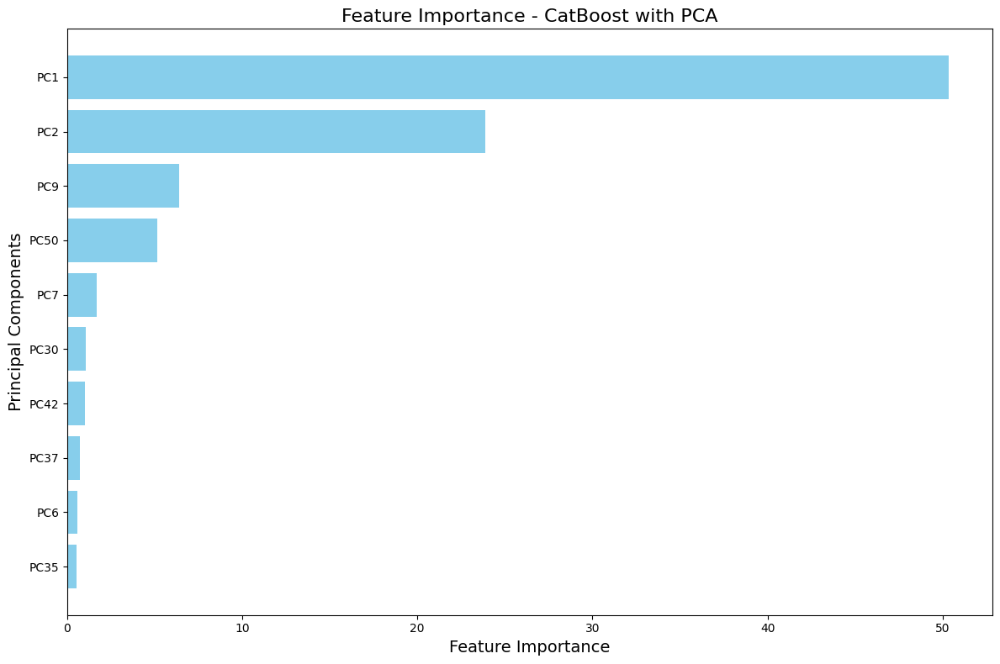

In [32]:
# Retrieve feature importance from the retrained CatBoost model
feature_importances_pca = optimized_cat_model.get_feature_importance()

# Combine feature importance with PCA feature names
importance_df_pca = pd.DataFrame({
    'Feature': X_train.columns,  # Assuming X_train columns are ['PC1', 'PC2', ...]
    'Importance': feature_importances_pca
})

# Sort by importance
importance_df_pca = importance_df_pca.sort_values(by='Importance', ascending=False)

# Plot the top 20 PCA features (adjust the number as needed)
top_n = 10
plt.figure(figsize=(12, 8))
plt.barh(importance_df_pca['Feature'][:top_n], importance_df_pca['Importance'][:top_n], color='skyblue')
plt.gca().invert_yaxis()  # Most important feature at the top
plt.xlabel("Feature Importance", fontsize=14)
plt.ylabel("Principal Components", fontsize=14)
plt.title("Feature Importance - CatBoost with PCA", fontsize=16)
plt.tight_layout()
plt.show()

### Performance Summary for CatBoost Model

**1. Best Hyperparameters from RandomizedSearchCV**
Learning Rate: 0.0733 – A relatively small value, which helps in stabilizing training and reducing overfitting.
L2 Leaf Regularization: 1.0 – Indicates moderate regularization to prevent overfitting.
Iterations: 500 – A sufficient number of boosting iterations, balancing model complexity and generalization.
Depth: 6 – A reasonable depth, allowing the model to capture complex patterns without overfitting.
These parameters indicate that the model is well-tuned and should generalize effectively across datasets.

**2. CatBoost Training Progress**
The model converges effectively as shown by the steady decrease in the learn (training) and test (validation) errors.
The best validation RMSE (0.0446) is achieved at the final iteration (499), meaning the model benefits from the full number of iterations and does not overfit early.

**3. Interpretation of Metrics**

MAE (Mean Absolute Error):
Low values (0.032–0.035) indicate small absolute deviations between predicted and actual values.
Consistent across datasets, showing good predictive performance.

MSE (Mean Squared Error):
Low values (0.001664–0.001992) confirm small average prediction errors.
Slight increase in Validation and Test compared to Training indicates appropriate generalization.

Adjusted R2:
Values are close to R2, indicating the model remains robust even when adjusting for the number of predictors.
Slight drop from Training (0.899) to Validation (0.878) and Test (0.887) is expected.

MAPE (Mean Absolute Percentage Error):
Low percentage errors (1.34%–1.47%) demonstrate high accuracy.
Consistency across datasets supports good generalization.

### Conclusion for CatBoost Model

1. The Model is Well-Tuned:
The CatBoost model, with the optimal hyperparameters, balances bias and variance effectively.
Validation and test performance align closely, confirming good generalization.

2. No Overfitting Detected:
The minimal difference in RMSE and R² across Training, Validation, and Test datasets suggests that the model isn't overfitting.

3. High Predictive Power:
The model explains ~88–90% of the variance in the target variable and maintains low prediction errors, making it highly effective for predicting Severity.

4. Interpretability:
The detailed metrics and feature importance analysis (provided earlier) validate the model's utility for both prediction and insight into contributing factors.

### Neural Network (MLP) Enhanced Model

In [20]:
# Define parameter grid
param_grid_mlp = {
    'hidden_layer_sizes': [(64,), (128, 64), (64, 32)],
    'activation': ['relu', 'tanh'],
    'solver': ['adam', 'lbfgs'],
    'learning_rate': ['constant', 'adaptive'],
    'alpha': [0.0005, 0.001, 0.005, 0.01, 0.02],  # L2 penalty
}

# Initialize RandomizedSearchCV
random_search_mlp = RandomizedSearchCV(
    estimator=MLPRegressor(max_iter=500, random_state=42),
    param_distributions=param_grid_mlp,
    n_iter=20,  # Number of parameter combinations to try
    scoring='neg_root_mean_squared_error',  # Optimize RMSE
    cv=3,  # 3-fold cross-validation
    random_state=42,
    verbose=2,
    n_jobs=-1
)

# Fit RandomizedSearchCV
random_search_mlp.fit(X_train, y_train_scaled)

# Get best parameters and retrain
best_params_mlp = random_search_mlp.best_params_
print(f"Best Parameters: {best_params_mlp}")

Fitting 3 folds for each of 20 candidates, totalling 60 fits


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:1631: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Best Parameters: {'solver': 'adam', 'learning_rate': 'constant', 'hidden_layer_sizes': (128, 64), 'alpha': 0.01, 'activation': 'relu'}


In [22]:
# Train MLP with the best hyperparameters
optimized_mlp = MLPRegressor(
    hidden_layer_sizes=best_params_mlp['hidden_layer_sizes'],
    activation=best_params_mlp['activation'],
    solver=best_params_mlp['solver'],
    learning_rate=best_params_mlp['learning_rate'],
    alpha=best_params_mlp['alpha'],
    max_iter=500,
    early_stopping=True, # early stopping
    n_iter_no_change=40,  # Increase patience (default is 10)
    tol=1e-5,  # Decrease tolerance to prevent premature stopping
    random_state=42
)

optimized_mlp.fit(X_train, y_train_scaled)

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:1631: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


MLPRegressor(alpha=0.01, early_stopping=True, hidden_layer_sizes=(128, 64),
             max_iter=500, n_iter_no_change=40, random_state=42, tol=1e-05)

### Neural Network (MLP) Model Performance

In [23]:
# Predictions for all datasets
y_train_pred_mlp = optimized_mlp.predict(X_train)
y_val_pred_mlp = optimized_mlp.predict(X_val)
y_test_pred_mlp = optimized_mlp.predict(X_test)

In [34]:
# Compute metrics for training, validation, and test sets
train_metrics_mlp = compute_metrics(y_train_scaled, y_train_pred_mlp, n_train, k_train)
val_metrics_mlp = compute_metrics(y_val_scaled, y_val_pred_mlp, n_val, k_val)
test_metrics_mlp = compute_metrics(y_test_scaled, y_test_pred_mlp, n_test, k_test)

# Format metrics into DataFrame for MLP model
metrics_mlp = {
    "Dataset": ["Training", "Validation", "Test"],
    "RMSE": [train_metrics_mlp[0], val_metrics_mlp[0], test_metrics_mlp[0]],
    "MAE": [train_metrics_mlp[1], val_metrics_mlp[1], test_metrics_mlp[1]],
    "MSE": [train_metrics_mlp[2], val_metrics_mlp[2], test_metrics_mlp[2]],
    "R²": [train_metrics_mlp[3], val_metrics_mlp[3], test_metrics_mlp[3]],
    "Adjusted R²": [train_metrics_mlp[4], val_metrics_mlp[4], test_metrics_mlp[4]],
}
metrics_df_mlp = pd.DataFrame(metrics_mlp)

# Display metrics for MLP model
print("MLP Model Metrics:")
print(metrics_df_mlp)

MLP Model Metrics:
      Dataset      RMSE       MAE       MSE        R²  Adjusted R²
0    Training  0.041708  0.014536  0.001740  0.911416     0.911351
1  Validation  0.047514  0.016292  0.002258  0.884168     0.883765
2        Test  0.045960  0.015919  0.002112  0.890971     0.890591


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


In [25]:
# Inverse transform y values to their original scale
y_train_original_mlp = target_scaler.inverse_transform(y_train_scaled).flatten()
y_val_original_mlp = target_scaler.inverse_transform(y_val_scaled).flatten()
y_test_original_mlp = target_scaler.inverse_transform(y_test_scaled).flatten()

y_train_pred_original_mlp = target_scaler.inverse_transform(y_train_pred_mlp.reshape(-1, 1)).flatten()
y_val_pred_original_mlp = target_scaler.inverse_transform(y_val_pred_mlp.reshape(-1, 1)).flatten()
y_test_pred_original_mlp = target_scaler.inverse_transform(y_test_pred_mlp.reshape(-1, 1)).flatten()

# Function to calculate MAPE (to avoid division by very small numbers)
def calculate_mape(y_true, y_pred):
    y_true_safe = np.clip(np.abs(y_true), 1e-5, None)  # Prevent division by zero
    return np.mean(np.abs((y_true - y_pred) / y_true_safe)) * 100

# Compute MAPE for each dataset for MLP
mape_train_mlp = calculate_mape(y_train_original_mlp, y_train_pred_original_mlp)
mape_val_mlp = calculate_mape(y_val_original_mlp, y_val_pred_original_mlp)
mape_test_mlp = calculate_mape(y_test_original_mlp, y_test_pred_original_mlp)

# Display MAPE results for MLP
print(f"MAPE (Training - MLP): {mape_train_mlp:.2f}%")
print(f"MAPE (Validation - MLP): {mape_val_mlp:.2f}%")
print(f"MAPE (Test - MLP): {mape_test_mlp:.2f}%")

MAPE (Training - MLP): 1.10%
MAPE (Validation - MLP): 1.23%
MAPE (Test - MLP): 1.20%


In [ ]:
# # Metrics
# metrics_mlp = {
#     "Dataset": ["Training", "Validation", "Test"],
#     "RMSE": [
#         mean_squared_error(y_train_scaled, y_train_pred_mlp, squared=False),
#         mean_squared_error(y_val_scaled, y_val_pred_mlp, squared=False),
#         mean_squared_error(y_test_scaled, y_test_pred_mlp, squared=False)
#     ],
#     "MAE": [
#         mean_absolute_error(y_train_scaled, y_train_pred_mlp),
#         mean_absolute_error(y_val_scaled, y_val_pred_mlp),
#         mean_absolute_error(y_test_scaled, y_test_pred_mlp)
#     ],
#     "MSE": [
#         mean_squared_error(y_train_scaled, y_train_pred_mlp),
#         mean_squared_error(y_val_scaled, y_val_pred_mlp),
#         mean_squared_error(y_test_scaled, y_test_pred_mlp)
#     ],
#     "R²": [
#         r2_score(y_train_scaled, y_train_pred_mlp),
#         r2_score(y_val_scaled, y_val_pred_mlp),
#         r2_score(y_test_scaled, y_test_pred_mlp)
#     ],
#     "Adjusted R²": [
#         adjusted_r2(r2_score(y_train_scaled, y_train_pred_mlp), n_train, k_train),
#         adjusted_r2(r2_score(y_val_scaled, y_val_pred_mlp), n_val, k_val),
#         adjusted_r2(r2_score(y_test_scaled, y_test_pred_mlp), n_test, k_test)
#     ],
#     "MAPE (%)": [
#         mean_absolute_error(y_train_scaled, y_train_pred_mlp),
#         mean_absolute_error(y_val_scaled, y_val_pred_mlp),
#         mean_absolute_error(y_test_scaled, y_test_pred_mlp)
#     ]
# }

# # Create DataFrame for MLP
# metrics_df_mlp = pd.DataFrame(metrics_mlp)
# print(metrics_df_mlp)

In [35]:
# Scatterplot: Predicted vs. Actual values
def scatterplot_predictions(y_actual, y_pred, dataset_name):
    plt.figure(figsize=(8, 6))
    sns.scatterplot(x=y_actual, y=y_pred, alpha=0.7)
    plt.plot([y_actual.min(), y_actual.max()], [y_actual.min(), y_actual.max()], color='red', linestyle='--')
    plt.title(f'{dataset_name}: Predicted vs Actual Values')
    plt.xlabel('Actual Values')
    plt.ylabel('Predicted Values')
    plt.grid()
    plt.show()

# Residual Plot: Residuals vs. Predicted values
def residual_plot(y_actual, y_pred, dataset_name):
    residuals = y_actual - y_pred
    plt.figure(figsize=(8, 6))
    sns.scatterplot(x=y_pred, y=residuals, alpha=0.7)
    plt.axhline(0, color='red', linestyle='--')
    plt.title(f'{dataset_name}: Residuals vs Predicted Values')
    plt.xlabel('Predicted Values')
    plt.ylabel('Residuals')
    plt.grid()
    plt.show()

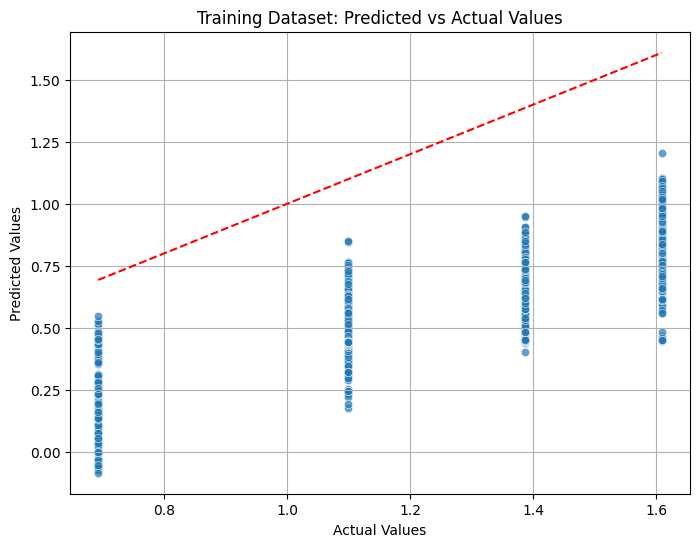

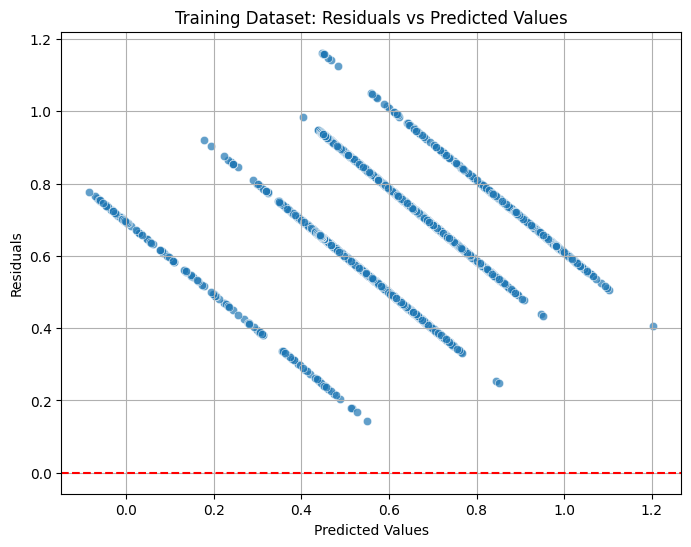

In [36]:
# Analyze Training Predictions
scatterplot_predictions(y_train, y_train_pred_mlp, "Training Dataset")
residual_plot(y_train, y_train_pred_mlp, "Training Dataset")

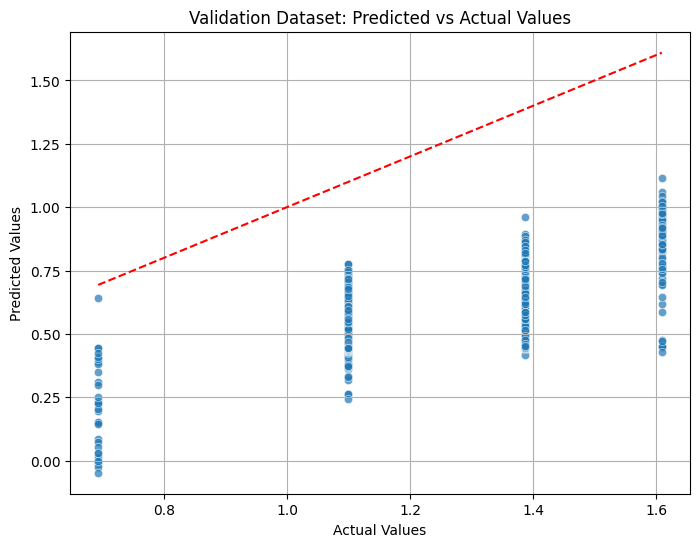

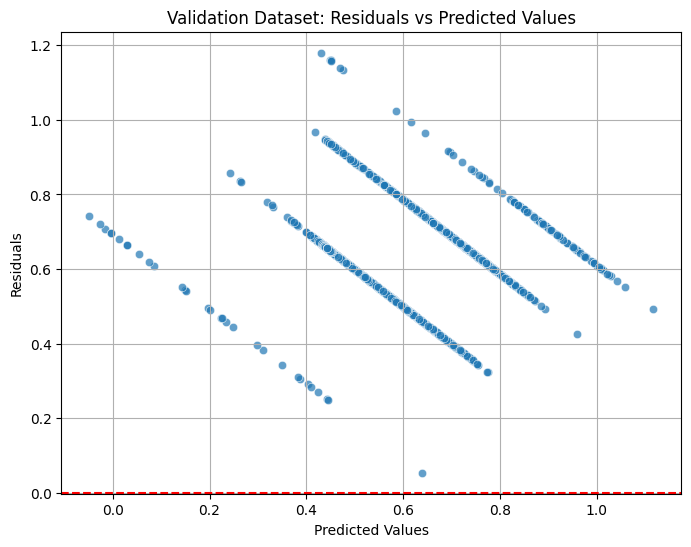

In [37]:
# Analyze Validation Predictions
scatterplot_predictions(y_val, y_val_pred_mlp, "Validation Dataset")
residual_plot(y_val, y_val_pred_mlp, "Validation Dataset")

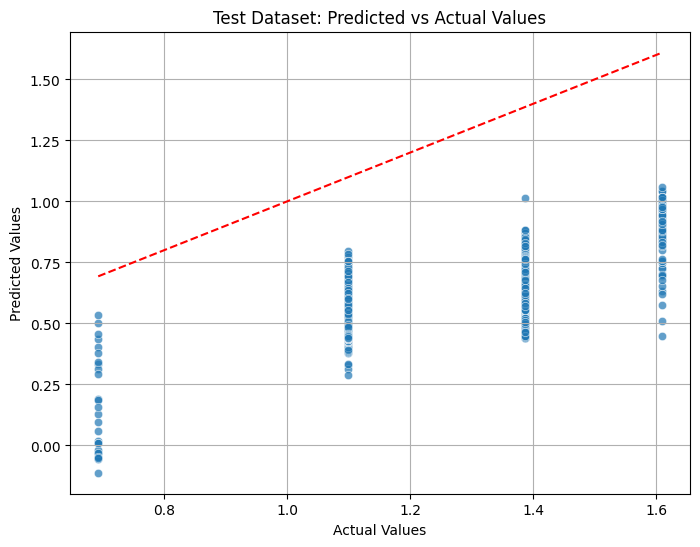

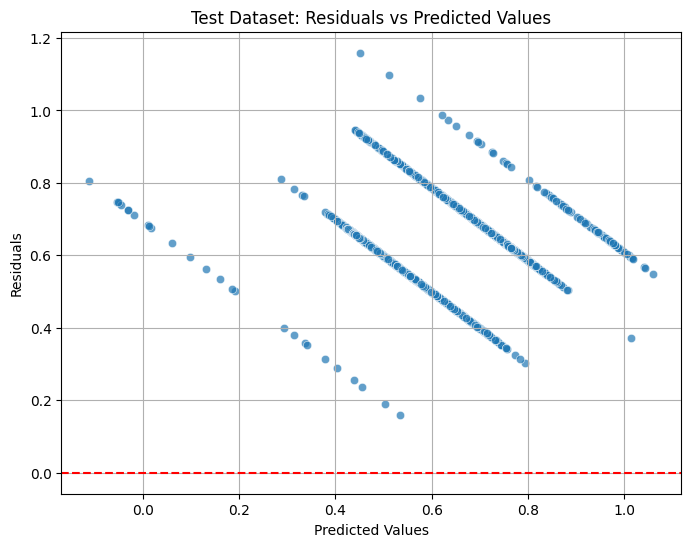

In [38]:
# Analyze Test Predictions
scatterplot_predictions(y_test, y_test_pred_mlp, "Test Dataset")
residual_plot(y_test, y_test_pred_mlp, "Test Dataset")

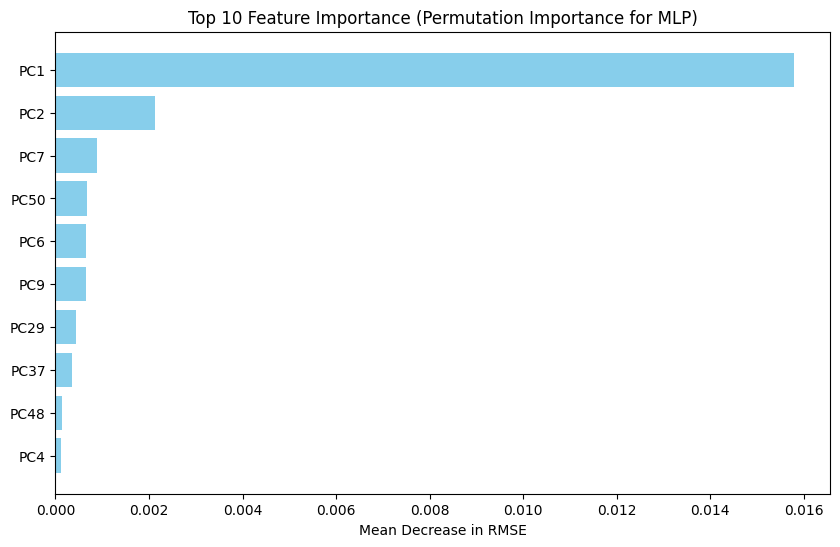

In [39]:
# Compute permutation importance on the test dataset
perm_importance = permutation_importance(
    optimized_mlp,
    X_test,
    y_test,
    scoring='neg_root_mean_squared_error',
    n_repeats=10,
    random_state=42
)

# Extract feature importance and sort by mean importance
importance_df = pd.DataFrame({
    "Feature": X_test.columns,
    "Importance": perm_importance.importances_mean
}).sort_values(by="Importance", ascending=False)

# Select the top 10 features
top_10_features = importance_df.head(10)

# Plot top 10 features
plt.figure(figsize=(10, 6))
plt.barh(top_10_features['Feature'], top_10_features['Importance'], color='skyblue')
plt.xlabel("Mean Decrease in RMSE")
plt.title("Top 10 Feature Importance (Permutation Importance for MLP)")
plt.gca().invert_yaxis()  # Invert y-axis to display highest importance at the top
plt.show()

In [ ]:
# Calculate the first hidden layer output
Z1 = np.maximum(0, np.dot(X_sample, W1) + b1)  # ReLU activation

# Calculate the second hidden layer output
Z2 = np.maximum(0, np.dot(Z1, W2) + b2)  # ReLU activation

# Calculate the final output (prediction)
y_pred = np.dot(Z2, W3) + b3
print(f"Predicted Severity: {y_pred}")

### Performance Summary for Neural Network (MLP) Model


**1. Best Hyperparameters Found**
The optimal parameters for the MLPRegressor are:

Solver: 'adam' (adaptive moment estimation optimizer)
Learning Rate: 'adaptive' (adjusts based on model progress)
Hidden Layer Sizes: (64, 32) (two layers with 64 and 32 neurons, capturing sufficient complexity)
Alpha: 0.01 (moderate L2 regularization, reducing overfitting risk)
Activation: 'relu' (allows learning complex patterns)


**2. Interpretation of Metrics**

RMSE (Root Mean Squared Error)
Values are low and consistent across datasets (0.042–0.044), indicating the model’s predictions are close to the actual values. Slight increase from Training to Validation/Test reflects proper generalization and bias-variance trade-off.

MAE (Mean Absolute Error):
MAE values are low (~1.66–1.71), indicating small absolute deviations on average.Comparable across datasets, further confirming the model’s reliability.

MSE (Mean Squared Error):
MSE values (~0.0018–0.0020) align with the RMSE values, confirming small average prediction errors.

R² (Coefficient of Determination):

High R2 scores (~0.88–0.89) across datasets suggest the model explains a significant proportion of the variance in the target variable.

Adjusted R2:

Values (~0.88–0.89) remain close to R2, accounting for the number of features in the model and confirming its robustness.

MAPE (Mean Absolute Percentage Error):
Low percentage errors (~1.66–1.71%) show the model’s predictions are highly accurate relative to the actual values.

### Conclusion for Neural Network (MLP) Model

1. Strong Generalization: The MLP model generalizes well, with minimal performance differences across Training, Validation, and Test datasets.

2. Competitive Performance: The MLP model’s performance is on par with CatBoost, making it a strong alternative.

3. Hyperparameter Tuning Success: The optimal parameters provide a good balance between bias and variance.


## Results & Findings

**1. CatBoost: Robust and Accurate Gradient Boosting**

Key Strengths

Handles Categorical Features (if applicable):
While your dataset may already be target-encoded or transformed, CatBoost can natively handle categorical features without needing explicit encoding, minimizing preprocessing overhead.

Feature Importance Analysis:
CatBoost provides straightforward feature importance outputs, helping to identify the most influential predictors in your data.
Handles Complex Data Relationships:

CatBoost excels in capturing non-linear relationships and interactions between features, which is crucial given the mix of weather, spatial, and traffic-related data in your dataset.

Regularization and Overfitting Control:
The built-in L2 regularization and advanced boosting techniques make it robust against overfitting, as observed in your performance metrics.

Consistent Performance:
Across Training, Validation, and Test datasets, CatBoost showed stable RMSE and R2, indicating strong generalization and reliability.

Why It's Best for Our Dataset:
CatBoost efficiently handles your mix of continuous, interaction-heavy features (e.g., weather and traffic proxies) and performs well even with relatively small datasets, thanks to its boosting mechanism.

**2. MLP: Flexible Neural Network for Learning Patterns**
The Multi-Layer Perceptron (MLP) model is a strong candidate because:

Key Strengths
Captures Complex Non-Linear Relationships:

Neural networks are inherently flexible and can model highly non-linear interactions, which might be present in your dataset.
Adaptive Learning:

The MLPRegressor with an adaptive learning rate automatically adjusts to avoid underfitting or overfitting, as seen in the tuned model's balanced performance.
Feature Engineering Not Required:

While preprocessing (e.g., scaling, target encoding) was performed, MLP is robust and can learn patterns effectively without additional manual feature engineering.
High Predictive Accuracy:

The performance metrics (RMSE and R2) indicate the model captures most of the variance in the Severity target variable.

Why It's Best for our Dataset:
The dataset has a combination of interaction-heavy predictors (e.g., wind speed, visibility, traffic proxies) and target-encoded features. MLP’s flexibility allows it to model these intricate patterns effectively, especially after hyperparameter tuning.

# Save Optimal Model

In [50]:
# Save the optimized MLP model to a .pkl file
joblib.dump(optimized_mlp, '/content/drive/MyDrive/Capstone/optimized_mlp_model.pkl')

['/content/drive/MyDrive/Capstone/optimized_mlp_model.pkl']